
# Regression Analysis Project
### Siddhesh Ashok Gholap
#### Date: 25 February 2024

---


The results of the regression analysis are presented below with visualizations and interpretations.

---


<b> Part - (1) :  Understanding Error Surfaces </b>

According to www.geogebra.org, the relationship between human height (in
inches) and weight (in pounds) is given by <br>
<center> $t = 3.86x - 110.42$ </center>

(a) Generated 25 meaningful data points from this relationship, mimicking a
noisy sensor, where the noise follows a zero mean Gaussian with a variance
of 20. Plotted the scatter plot of the data. <br>

(b) Estimated the above relationship from the noisy data
generated in (a) by fitting a line, i.e $\hat{t} = y(x,w) = w_{0} + w_{1}x$. Used least squares criterion to estimate the parameters $w_{0}$ and $w_{1}$. Generated and plotted the error surface $J(w_{0},w_{1})$ associated with this approach. Minimum has been located on this error surface.<br>

(c) Estimated the parameters using least squares approach, and compared them
with the desired values.
<center> $\textbf{w}_{opt} = (\textbf{X}^{T}\textbf{X})^{-1}\textbf{X}^{T}\textbf{t}$</center>

(d) Observations

<b> Part - (2) : Understanding model order and overfitting  </b>

(a). Generated  20  data  points  from $t_{n} = sin(2πx_{n}) + e_{n}$, where $x_{n} \in [0,1] $ and $e_{n} \thicksim \mathcal{N} (0,0.1)$ , and divided them into two sets, a training set and a testing set, with each set containing 10 points <br>

(b). Fitted  an $M^{th}$ degree  polynomial  to  the  training  data  using  least  squares approach, i.e.,
<center> $\hat{t_{n}} = w_{0} + w_{1}x + .... +  w_{m}x^{m} + ... + w_{M}x^{M} $ </center>

Used the estimated parameter vector $\textbf{w}$, to predict the target values in training and testing datasets.  Plotted the root mean squared error associated with each dataset, for M=0,1,...,9. Results are explained. <br>

(c) Increased the size of the training dataset to 100 points, and repeated (b). <br>

(d) Added a $l_{2}$ regularization term to the objective function in (b) and repeated (b) and (c).  Studied the effect of Lagrange multiplier λ on the root mean squared error of the training and testing datasets <br>

(e) Modified the function in (a) to $t_{n}=5+sin(2πx_{n})+e_{n}$ to study the effect of regularizing the bias coefficient $w_{0}$.

(f) Observations

<b> Part - (3) : Understanding the choice of kernel  </b>


(a). Generated 100 data points from $t_{n}=sin(2πx_{n})+e_{n}$, where $x_{n} \in [0 1]$ and $e_{n} \thicksim \mathcal{N}(0,0.1)$, and divided them into two sets, a training set and a testing test each containing 50 points.  Fitted an $M^{th}$ degree polynomial using polynomial,Gaussian and sigmoidal kernels, and studied the goodness of fit in each case, for different model orders M

(b). Repeated (a) by modifying the target function to <br>
<center> $t_{n} = $ $\begin{cases}
 \text{sinusoid} + e_{n} , \;\; where \;\; x  \in [0,1) \\
 \text{triangle} + e_{n} , \;\; where \;\; x  \in [1,2) \\
 \text{Gaussian} + e_{n} , \;\; where \;\; x  \in [2,3) \\
\end{cases}$ </center>

Observations/results for each of the three kernels are discussed.

(c). Observations

<b> Part - (4) : Understanding online training  </b>

(a). Repeated 3(a) and 3(b) using stochastic gradient descent for weight update. Studied the effect of step size η on convergence of the weights, and compared them to those obtained using closed form expressions in 3. Plotted the mse as a function of iterations.

(b). Studied the effect of batch size on the speed of convergence.

(c). Observations

<b> Part - (5) : Understanding bias-variance trade-off  </b>

(a). Generated L=100 datasets of noisy sinusoidal data, each having N=25  datapoints. For each dataset, fitted a $M=25^{th}$ order linear regression model consisting of 24 Gaussian basis functions and one bias parameter.  Used regularized least squares, governed by the parameter λ, to estimate the parameters $\textbf{w}$. Illustrated the concept of bias and variance using these 100 different parameter fits.
1. Chose three different regularization coefficeints (low,middle and high)
2. For every regularization coefficient, produced two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
2. For three regularization coefficients, plotted a total of six plots, meaning two plots for each regularization.
3. Using the six plots above, the bias-variance trade-off is described.


(b). Observations







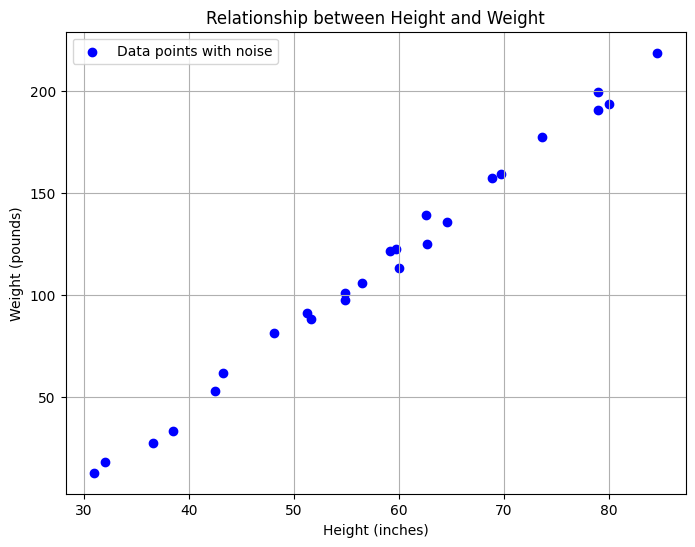

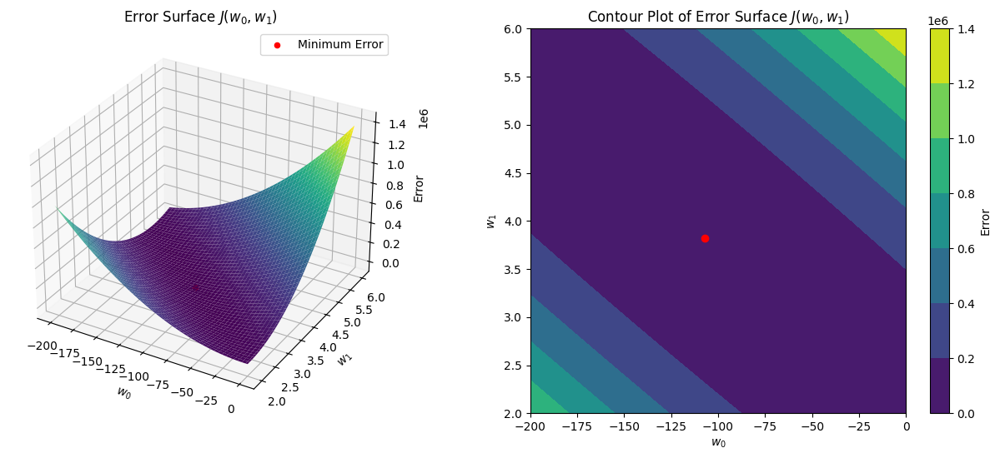

Minimum error occurs at w0 = -107.07, w1 = 3.82


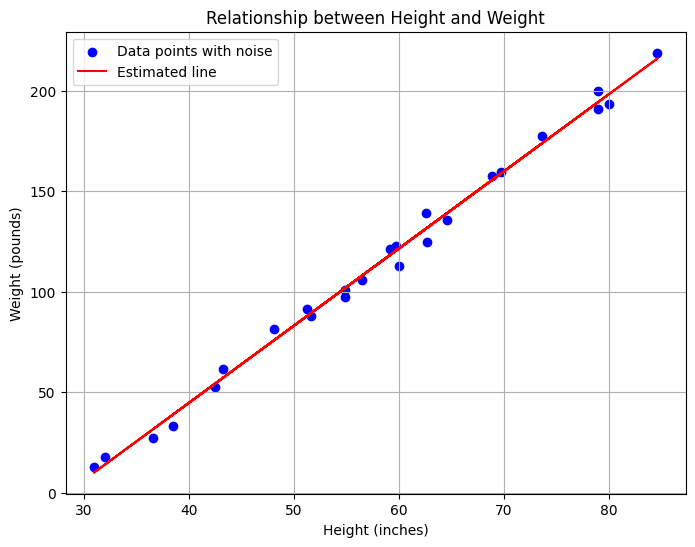

Desired w0: -110.42
Desired w1: 3.86
Estimated w0: -108.83606734636463
Estimated w1: 3.837775512541596


In [20]:
#Understanding Error Surface
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

########################################
#Generate meaningfull data
########################################

def generate_data(n_points, variance=20):
    heights = np.random.uniform(30, 85, n_points) 
   
    weights_without_noise = 3.86 * heights - 110.42
    
    noise = np.random.normal(0, np.sqrt(variance), n_points)
    weights = weights_without_noise + noise
    
    return heights, weights
 
n_points = 25
heights, weights = generate_data(n_points)

########################################
#Plot scatter plot of data
########################################

plt.figure(figsize=(8, 6))
plt.scatter(heights, weights, color='blue', label='Data points with noise')
plt.title('Relationship between Height and Weight')
plt.xlabel('Height (inches)')
plt.ylabel('Weight (pounds)')
plt.legend()
plt.grid(True)
plt.show()


########################################
#Weight estimation through error surface, i.e., empirically locate the minima of error surface
########################################
#Sample a bunch of w's around w_opt and compute the associated error



#Compute the error
def Error(w, t, x):  # inputs: 1)weight 2)data i.e (t,x)
    w0, w1 = w
    
    # Estimate the target
    t_hat = w0 + w1 * x

    # Compute and return the error
    error = np.sum((t_hat - t) ** 2)
    return error


#Plot 3D error surface and the corresponding contour plots
#Error surface is a function of w0 and w1

n_points = 100
w0_values = np.linspace(-200, 0, n_points)
w1_values = np.linspace(2, 6, n_points)
W0, W1 = np.meshgrid(w0_values, w1_values)
error_surface = np.zeros_like(W0)

for i in range(n_points):
    for j in range(n_points):
        error_surface[i, j] = Error([w0_values[j], w1_values[i]], weights, heights)

min_error_index = np.unravel_index(np.argmin(error_surface), error_surface.shape)
min_error_w0 = w0_values[min_error_index[1]]
min_error_w1 = w1_values[min_error_index[0]]

# Plot the error surface
fig = plt.figure(figsize=(16, 6))

# Plot 3D surface
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(W0, W1, error_surface, cmap='viridis', edgecolor='none')
ax1.set_title('Error Surface $J(w_0, w_1)$')
ax1.set_xlabel('$w_0$')
ax1.set_ylabel('$w_1$')
ax1.set_zlabel('Error')
ax1.scatter(min_error_w0, min_error_w1, error_surface[min_error_index], color='red', label='Minimum Error')
ax1.legend()

# Plot contour plot
ax2 = fig.add_subplot(122)
contour = ax2.contourf(W0, W1, error_surface, cmap='viridis')
ax2.scatter(min_error_w0, min_error_w1, color='red', label='Minimum Error')
ax2.set_title('Contour Plot of Error Surface $J(w_0, w_1)$')
ax2.set_xlabel('$w_0$')
ax2.set_ylabel('$w_1$')
plt.colorbar(contour, ax=ax2, label='Error')
plt.show()

print(f"Minimum error occurs at w0 = {min_error_w0:.2f}, w1 = {min_error_w1:.2f}")



########################################
# Least squares approach to estimate the weights
########################################

# Complete the below linear regression function
def LinearRegression(x, t):  # inputs: 1)input data i.e (x). 2)target i.e (t)
    X = np.column_stack((np.ones_like(x), x))
    
    w_opt = np.linalg.inv(X.T @ X) @ X.T @ t
    
    return w_opt


# Estimate optimal weight's using "LinearRegression" function
w_opt = LinearRegression(heights, weights)


# Estimate the targets using the input x and the estimated weights
t_hat = w_opt[0] + w_opt[1] * heights


# Plot the estimated line on top of the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(heights, weights, color='blue', label='Data points with noise')
plt.plot(heights, t_hat, color='red', label='Estimated line')
plt.title('Relationship between Height and Weight')
plt.xlabel('Height (inches)')
plt.ylabel('Weight (pounds)')
plt.legend()
plt.grid(True)
plt.show()


########################################
# Compare the estimated weights using least squares approach with the error surface approach
########################################

print("Desired w0: -110.42")
print("Desired w1: 3.86")
print("Estimated w0:", w_opt[0])
print("Estimated w1:", w_opt[1])


<b><h3> Observations </h3></b>

1.From the scatter plot it can be observed that despite the added noise, the trend of heights and weights is well followed with respect to the actual relation.

2.The error surface has a convex shape, thus it points to a minima with respect to the given parameters. 

3.Parameters estimated by least square approach and those from the minima of error surface seem to match closely with each other and the actual value of those parameters.







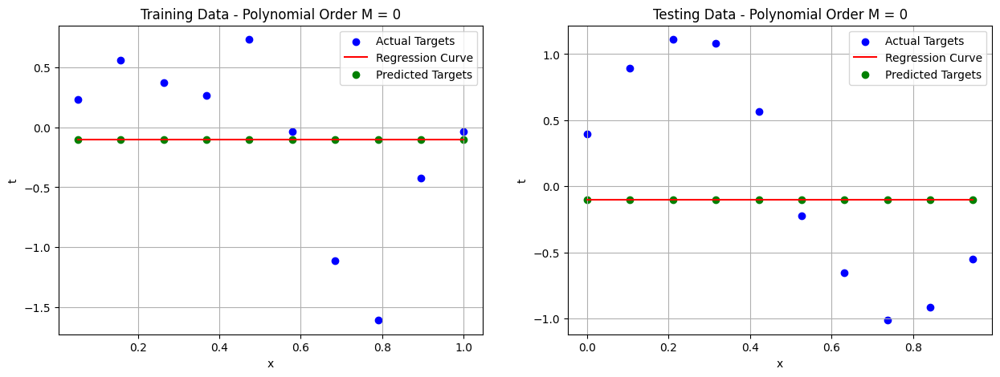

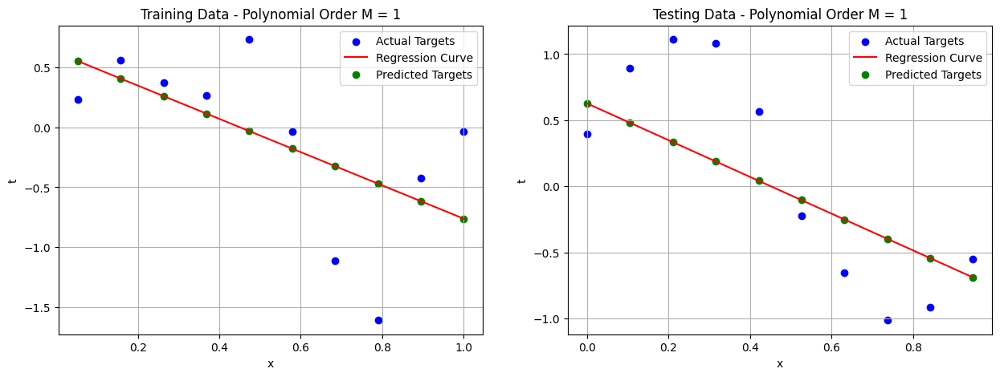

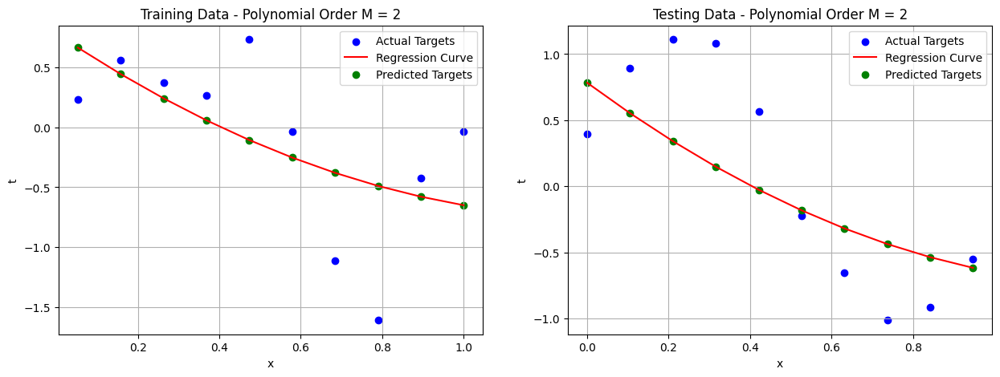

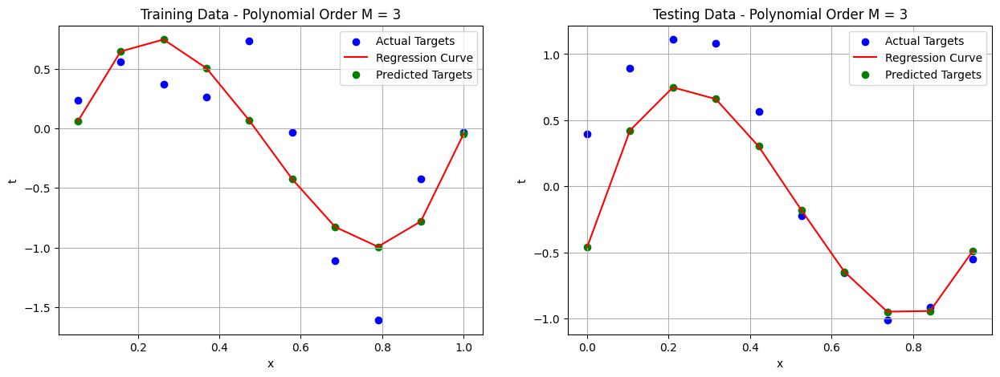

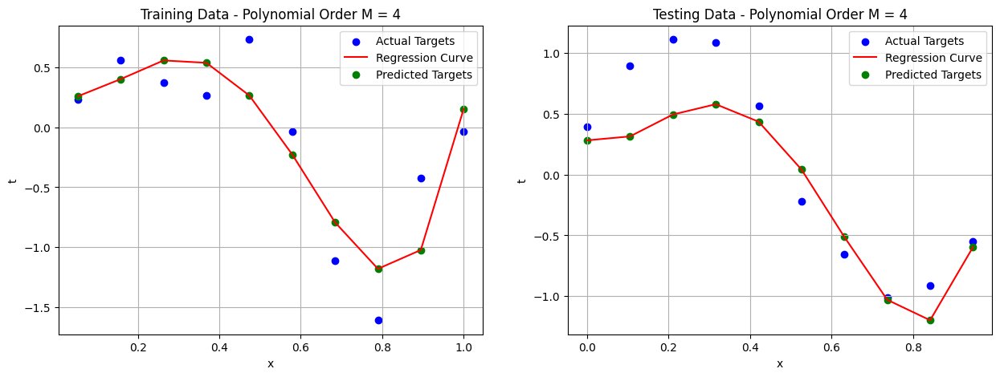

...

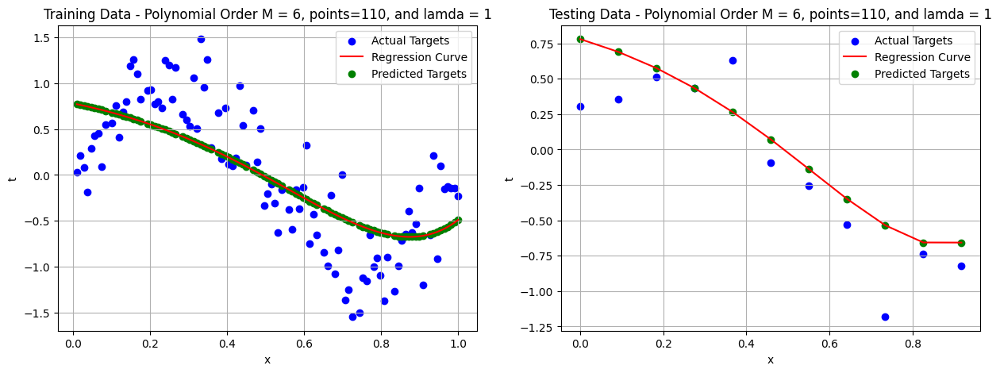

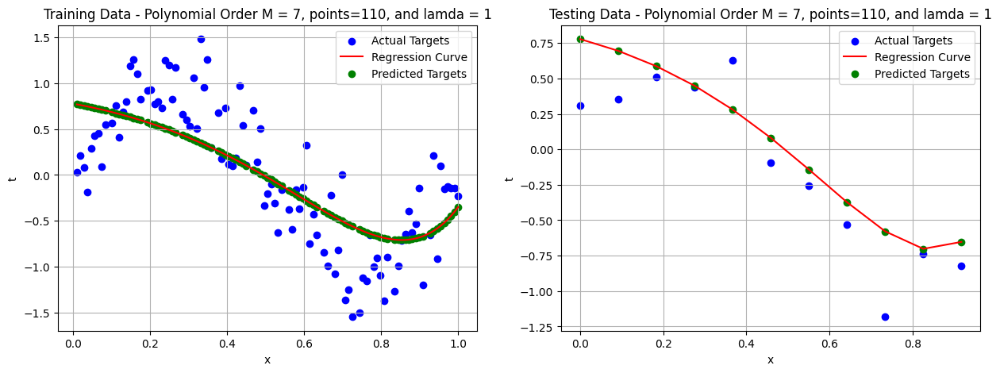

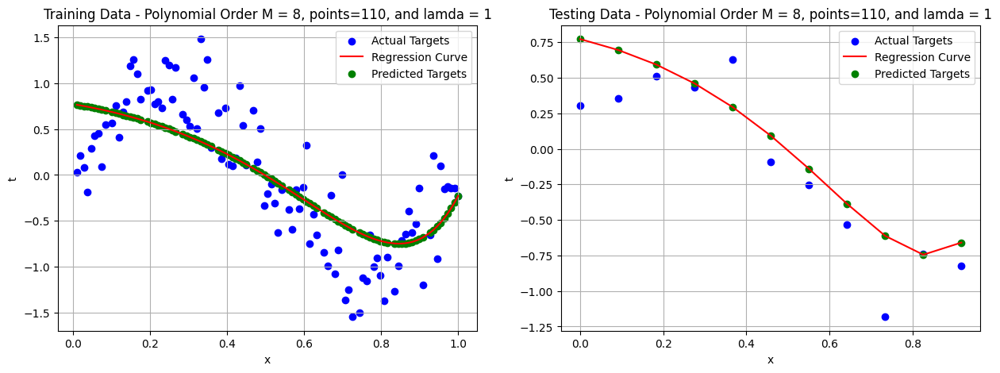

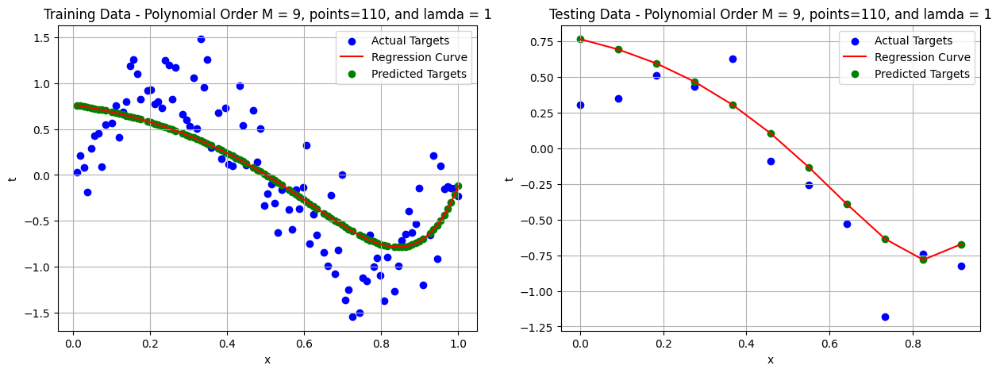

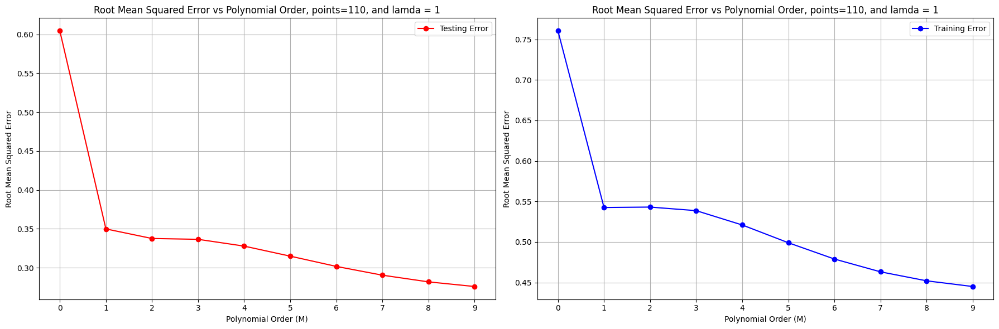

In [21]:
#Understanding model order and overfitting
########################################
#Generate 20 data points
########################################

x_values = np.linspace(0,1,20)

t_values = np.sin(2 * np.pi * x_values) + np.random.normal(0, np.sqrt(0.1), 20)


#Obtain train and test splits

x_train = []
t_train = []

x_test = []
t_test = []
for i in range(len(x_values)):
    if i % 2 != 0:
        x_train.append(x_values[i])
        t_train.append(t_values[i])
    else:
        x_test.append(x_values[i])
        t_test.append(t_values[i])
        
x_train = np.array(x_train)
t_test = np.array(t_test)
t_train = np.array(t_train)
x_test = np.array(x_test)


########################################
#Fitting Mth degree polynomial using least squares approach
########################################
#Complete the function
def PolynomialFit(X_train,Y_train,M,lamda): #(training data, trining targets, Model order, Regularization coefficient)
    # Transform the data using polynomial kernel
    X_train_transformed = np.column_stack([X_train ** i for i in range(M + 1)])

    # Find Pseudo inverse solution
    w_opt = np.linalg.inv(X_train_transformed.T @ X_train_transformed + lamda*np.eye(M+1)) @ X_train_transformed.T @ Y_train
    
    # Return the weight vector
    return w_opt

#Complete the function
def PolynomialPred(w_est,X_train,X_test): #(weight,training data, testing data, training targets, testing targets)
    # Estimate the targets for both training and testing data
    Y_train_pred = np.dot(np.column_stack([X_train ** i for i in range(len(w_est))]), w_est)
    Y_test_pred = np.dot(np.column_stack([X_test ** i for i in range(len(w_est))]), w_est)

    # Return training and testing predictions
    return Y_train_pred, Y_test_pred

#Complete the function
def PolynomialPred_Error(w_est,X_train,X_test,Y_train,Y_test): #(weight,training data, testing data, training targets, testing targets)
    # Estimate the targets for both training and testing data
    Y_train_pred = np.dot(np.column_stack([X_train ** i for i in range(len(w_est))]), w_est)
    Y_test_pred = np.dot(np.column_stack([X_test ** i for i in range(len(w_est))]), w_est)

    # Calculate root mean squared error
    TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
    TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))

    # Return training and testing error
    return TrainError, TestError

#Iterate through range of M values
M_range=list(range(10))
TrError = []
TeError = []

    
for M in M_range:
    # Fit Mth order polynomial i.e estimate optimal w
    w_opt = PolynomialFit(x_train, t_train, M, 0)  # Regularization coefficient lamda = 0

    # Predict training and testing targets
    Y_train_pred, Y_test_pred = PolynomialPred(w_opt, x_train, x_test)

    # Predict errors on both training and testing data using estimated w
    TrainError, TestError = PolynomialPred_Error(w_opt, x_train, x_test, t_train, t_test)

    # Store them for plotting
    TrError.append(TrainError)
    TeError.append(TestError)
    
    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train, t_train, color='blue', label='Actual Targets')
    plt.plot(x_train, Y_train_pred, color='red', label='Regression Curve')
    plt.scatter(x_train, Y_train_pred, color='green', label='Predicted Targets')
    plt.title(f'Training Data - Polynomial Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)

    # Plot testing data
    plt.subplot(1, 2, 2)
    plt.scatter(x_test, t_test, color='blue', label='Actual Targets')
    plt.plot(x_test, Y_test_pred, color='red', label='Regression Curve')
    plt.scatter(x_test, Y_test_pred, color='green', label='Predicted Targets')
    plt.title(f'Testing Data - Polynomial Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)


#Plot training and testing estimates alogwith the original targets



# Create a single figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot testing error vs polynomial order
ax1.plot(M_range, TeError, marker='o', color='red', label='Testing Error')
ax1.set_title('Root Mean Squared Error vs Polynomial Order')
ax1.set_xlabel('Polynomial Order (M)')
ax1.set_ylabel('Root Mean Squared Error')
ax1.set_xticks(M_range)
ax1.legend()
ax1.grid(True)

# Plot training error vs polynomial order
ax2.plot(M_range, TrError, marker='o', color='blue', label='Training Error')
ax2.set_title('Root Mean Squared Error vs Polynomial Order')
ax2.set_xlabel('Polynomial Order (M)')
ax2.set_ylabel('Root Mean Squared Error')
ax2.set_xticks(M_range)
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()


########################################
#Increase the size of training data set to 100 points and repeat the experiments
########################################

x_values = np.linspace(0,1,110)

t_values = np.sin(2 * np.pi * x_values) + np.random.normal(0, np.sqrt(0.1), 110)


#Obtain train and test splits

x_train_list = []
t_train_list = []

x_test_list = []
t_test_list = []
for i in range(len(x_values)):
    if i % 10 != 0:
        x_train_list.append(x_values[i])
        t_train_list.append(t_values[i])
    else:
        x_test_list.append(x_values[i])
        t_test_list.append(t_values[i])
        
x_train_2 = np.array(x_train_list)
t_test_2 = np.array(t_test_list)
t_train_2 = np.array(t_train_list)
x_test_2 = np.array(x_test_list)

TrError = []
TeError = []

for M in M_range:
    # Fit Mth order polynomial i.e estimate optimal w
    w_opt = PolynomialFit(x_train_2, t_train_2, M, 0)  # Regularization coefficient lamda = 0

    # Predict training and testing targets
    Y_train_pred, Y_test_pred = PolynomialPred(w_opt, x_train_2, x_test_2)

    # Predict errors on both training and testing data using estimated w
    TrainError, TestError = PolynomialPred_Error(w_opt, x_train_2, x_test_2, t_train_2, t_test_2)

    # Store them for plotting
    TrError.append(TrainError)
    TeError.append(TestError)
    
    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train_2, t_train_2, color='blue', label='Actual Targets')
    plt.plot(x_train_2, Y_train_pred, color='red', label='Regression Curve')
    plt.scatter(x_train_2, Y_train_pred, color='green', label='Predicted Targets')
    plt.title(f'Training Data - Polynomial Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)

    # Plot testing data
    plt.subplot(1, 2, 2)
    plt.scatter(x_test_2, t_test_2, color='blue', label='Actual Targets')
    plt.plot(x_test_2, Y_test_pred, color='red', label='Regression Curve')
    plt.scatter(x_test_2, Y_test_pred, color='green', label='Predicted Targets')
    plt.title(f'Testing Data - Polynomial Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)
    

#Plot training and testing estimates alogwith the original targets



# Create a single figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot testing error vs polynomial order
ax1.plot(M_range, TeError, marker='o', color='red', label='Testing Error')
ax1.set_title('Root Mean Squared Error vs Polynomial Order')
ax1.set_xlabel('Polynomial Order (M)')
ax1.set_ylabel('Root Mean Squared Error')
ax1.set_xticks(M_range)
ax1.legend()
ax1.grid(True)

# Plot training error vs polynomial order
ax2.plot(M_range, TrError, marker='o', color='blue', label='Training Error')
ax2.set_title('Root Mean Squared Error vs Polynomial Order')
ax2.set_xlabel('Polynomial Order (M)')
ax2.set_ylabel('Root Mean Squared Error')
ax2.set_xticks(M_range)
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

########################################
#Effect of regularization
########################################
#Consider a set of lambda's. For example: lamdas = [0, 1e-7 , 1e-4, 1e-2, 1]
#Repeat the experiments, i.e., plot the prediction and error in predictions with respect to model order. Contrast these results with those obtained without regularization.

lamdas = [1e-7, 1e-5, 1e-3, 1e-1, 1]

for lamb in lamdas:
    
    TrError = []
    TeError = []

    for M in M_range:
        # Fit Mth order polynomial i.e estimate optimal w
        w_opt = PolynomialFit(x_train, t_train, M, lamb)  # Regularization coefficient lamda = 0

        # Predict training and testing targets
        Y_train_pred, Y_test_pred = PolynomialPred(w_opt, x_train, x_test)

        # Predict errors on both training and testing data using estimated w
        TrainError, TestError = PolynomialPred_Error(w_opt, x_train, x_test, t_train, t_test)

        # Store them for plotting
        TrError.append(TrainError)
        TeError.append(TestError)
        
        # Plot training data
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(x_train, t_train, color='blue', label='Actual Targets')
        plt.plot(x_train, Y_train_pred, color='red', label='Regression Curve')
        plt.scatter(x_train, Y_train_pred, color='green', label='Predicted Targets')
        plt.title(f'Training Data - Polynomial Order M = {M}, points=20, lamda = {lamb}')
        plt.xlabel('x')
        plt.ylabel('t')
        plt.legend()
        plt.grid(True)

        # Plot testing data
        plt.subplot(1, 2, 2)
        plt.scatter(x_test, t_test, color='blue', label='Actual Targets')
        plt.plot(x_test, Y_test_pred, color='red', label='Regression Curve')
        plt.scatter(x_test, Y_test_pred, color='green', label='Predicted Targets')
        plt.title(f'Testing Data - Polynomial Order M = {M}, points=20, lamda = {lamb}')
        plt.xlabel('x')
        plt.ylabel('t')
        plt.legend()
        plt.grid(True)
    

    #Plot training and testing estimates alogwith the original targets

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    # Plot testing error vs polynomial order
    ax1.plot(M_range, TeError, marker='o', color='red', label='Testing Error')
    ax1.set_title('Root Mean Squared Error vs Polynomial Order, points=20, lamda = '+str(lamb))
    ax1.set_xlabel('Polynomial Order (M)')
    ax1.set_ylabel('Root Mean Squared Error')
    ax1.set_xticks(M_range)
    ax1.legend()
    ax1.grid(True)

    # Plot training error vs polynomial order
    ax2.plot(M_range, TrError, marker='o', color='blue', label='Training Error')
    ax2.set_title('Root Mean Squared Error vs Polynomial Order, points=20, lamda = '+str(lamb))
    ax2.set_xlabel('Polynomial Order (M)')
    ax2.set_ylabel('Root Mean Squared Error')
    ax2.set_xticks(M_range)
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()

for lamb in lamdas:
    
    TrError = []
    TeError = []

    for M in M_range:
        # Fit Mth order polynomial i.e estimate optimal w
        w_opt = PolynomialFit(x_train_2, t_train_2, M, lamb)  # Regularization coefficient lamda = 0

        # Predict training and testing targets
        Y_train_pred, Y_test_pred = PolynomialPred(w_opt, x_train_2, x_test_2)

        # Predict errors on both training and testing data using estimated w
        TrainError, TestError = PolynomialPred_Error(w_opt, x_train_2, x_test_2, t_train_2, t_test_2)

        # Store them for plotting
        TrError.append(TrainError)
        TeError.append(TestError)
        
        # Plot training data
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(x_train_2, t_train_2, color='blue', label='Actual Targets')
        plt.plot(x_train_2, Y_train_pred, color='red', label='Regression Curve')
        plt.scatter(x_train_2, Y_train_pred, color='green', label='Predicted Targets')
        plt.title(f'Training Data - Polynomial Order M = {M}, points=110, and lamda = {lamb}')
        plt.xlabel('x')
        plt.ylabel('t')
        plt.legend()
        plt.grid(True)

        # Plot testing data
        plt.subplot(1, 2, 2)
        plt.scatter(x_test_2, t_test_2, color='blue', label='Actual Targets')
        plt.plot(x_test_2, Y_test_pred, color='red', label='Regression Curve')
        plt.scatter(x_test_2, Y_test_pred, color='green', label='Predicted Targets')
        plt.title(f'Testing Data - Polynomial Order M = {M}, points=110, and lamda = {lamb}')
        plt.xlabel('x')
        plt.ylabel('t')
        plt.legend()
        plt.grid(True)
    

    #Plot training and testing estimates alogwith the original targets
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    # Plot testing error vs polynomial order
    ax1.plot(M_range, TeError, marker='o', color='red', label='Testing Error')
    ax1.set_title('Root Mean Squared Error vs Polynomial Order, points=110, and lamda = '+str(lamb))
    ax1.set_xlabel('Polynomial Order (M)')
    ax1.set_ylabel('Root Mean Squared Error')
    ax1.set_xticks(M_range)
    ax1.legend()
    ax1.grid(True)

    # Plot training error vs polynomial order
    ax2.plot(M_range, TrError, marker='o', color='blue', label='Training Error')
    ax2.set_title('Root Mean Squared Error vs Polynomial Order, points=110, and lamda = '+str(lamb))
    ax2.set_xlabel('Polynomial Order (M)')
    ax2.set_ylabel('Root Mean Squared Error')
    ax2.set_xticks(M_range)
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()


########################################
#Effect of bias regularization
########################################
#Modify the function i.e include bias
#Generate data



#Estimate the polynomial with and without regularization constraint



#Compare the two estimated polynomials and report the observations



<b> Observations </b>

1.For number of points = 20, Testing error overshoots for higher M values but training error gradually decreases on incresing M.

2.The regression curve seems to be best fitting for middle values of M ex. 3, 4 or 5.

3.On increasing the number of training points to 100, both the training and testing data starts to perform better. Error values of both training and testing datas decrease gradually with increase in M.

4.On increasing the lamda values, overall rms error do not show much difference but the regression curve start to deviate from the original and become more generalized.



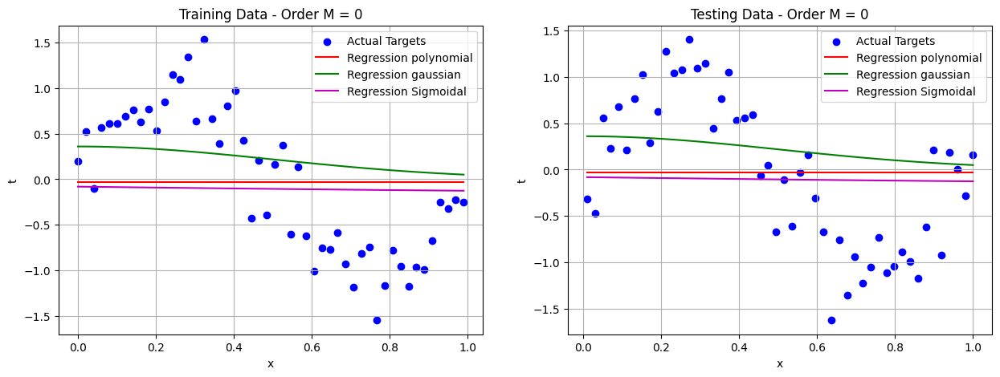

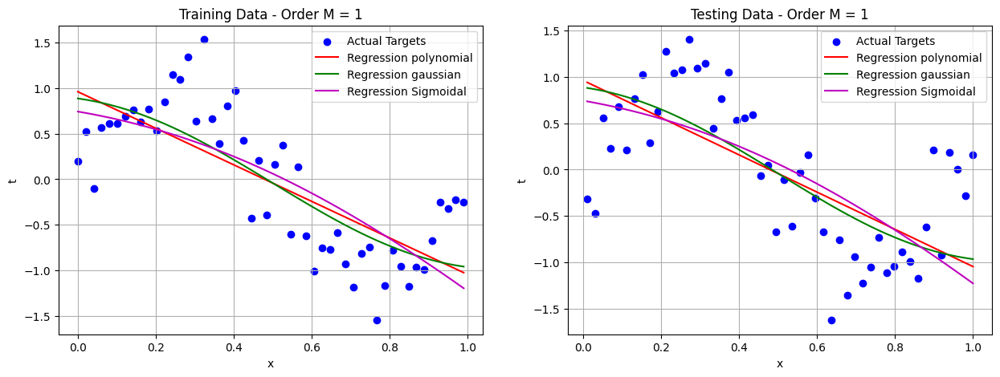

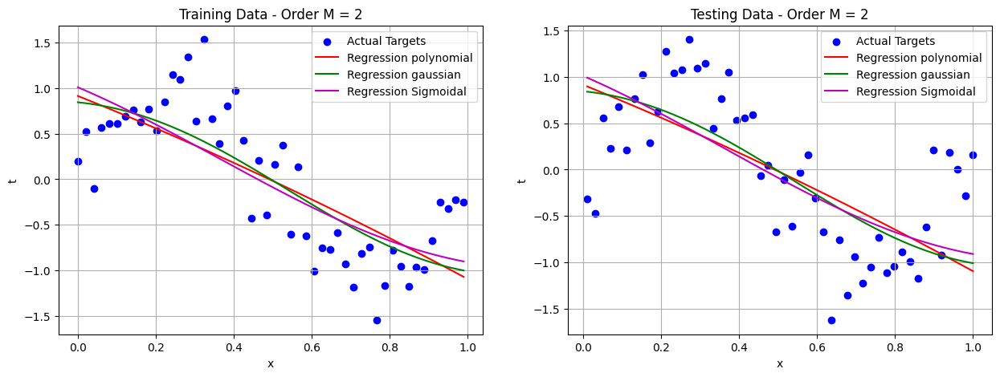

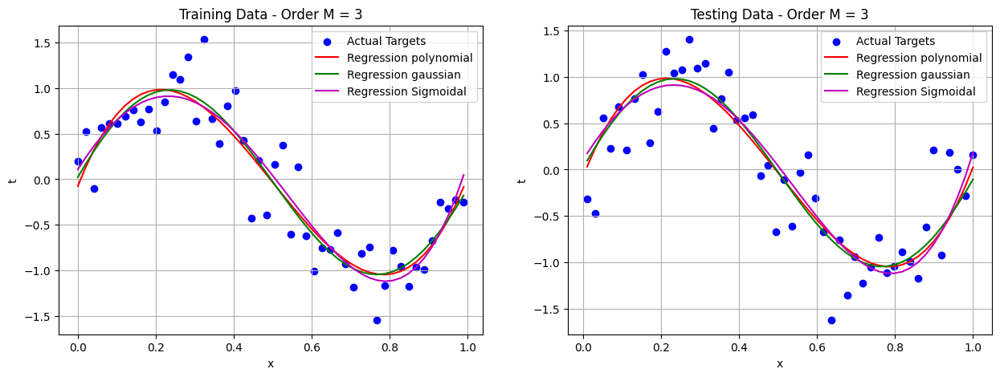

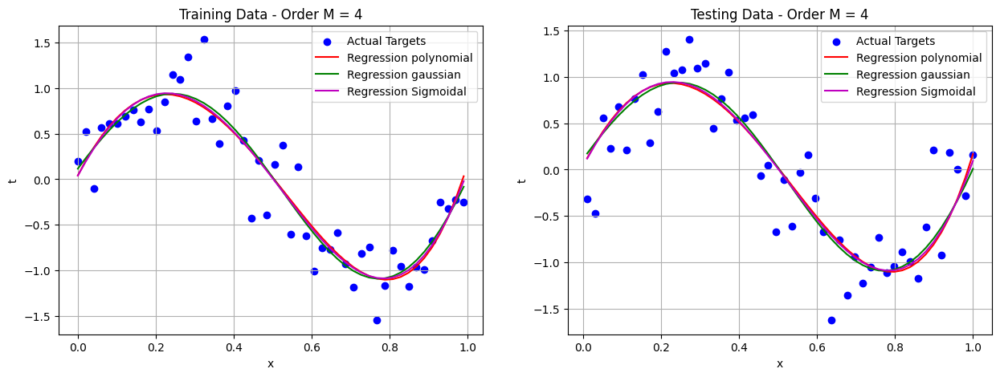

...

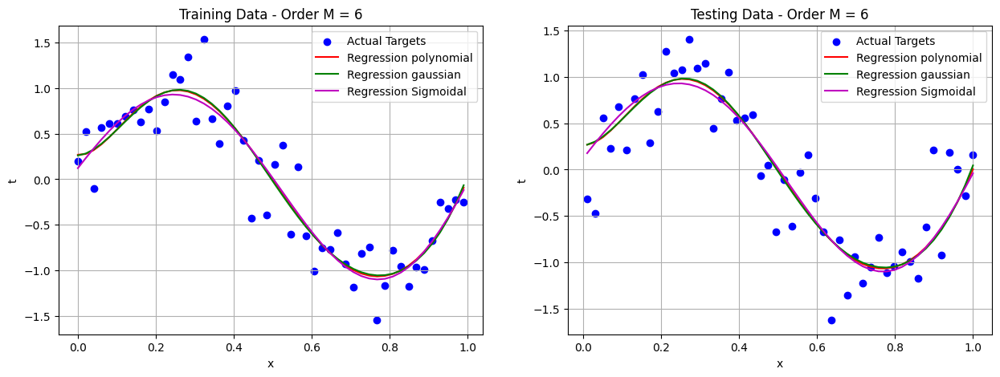

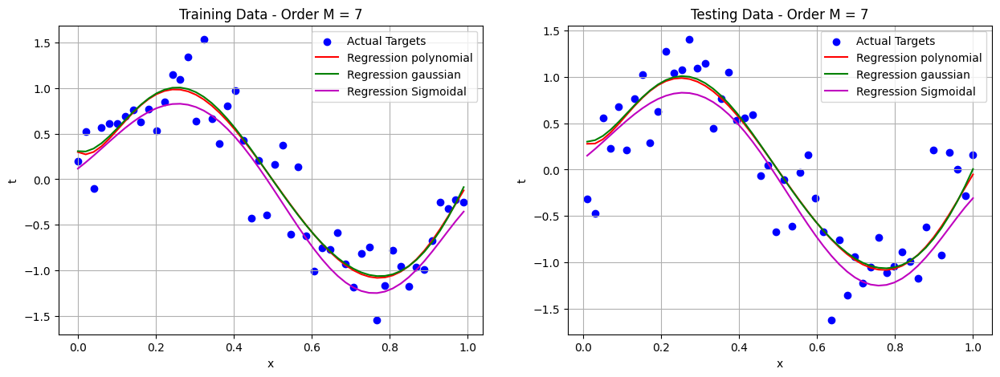

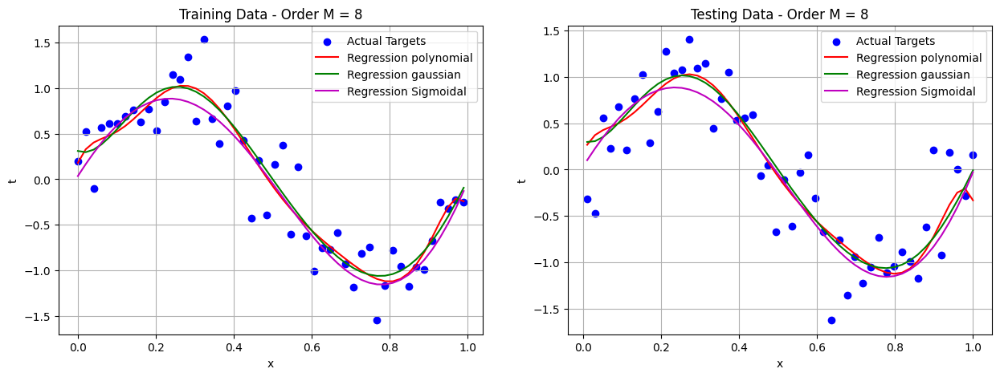

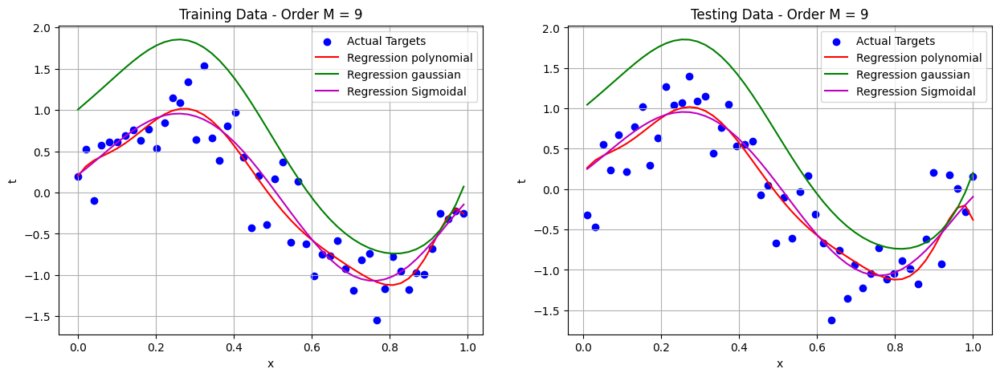

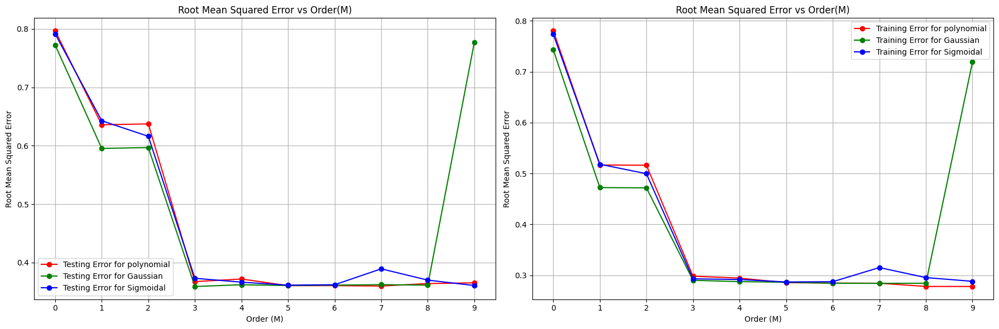

-------FOR THE MODIFIED TARGET FUNCTION-------4


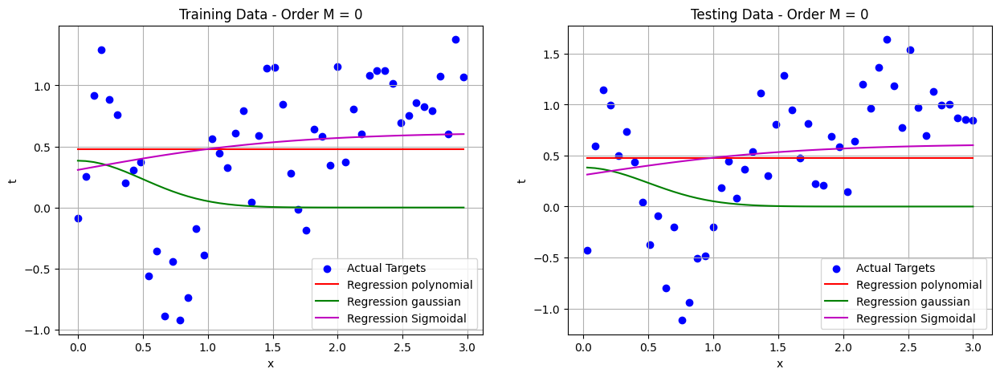

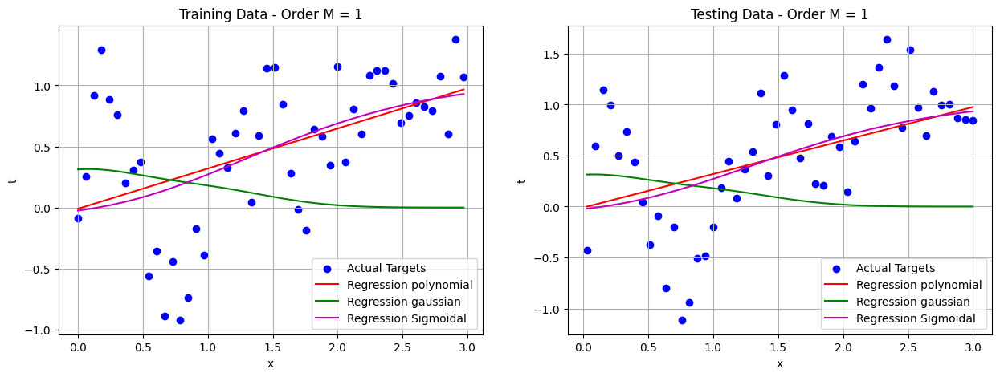

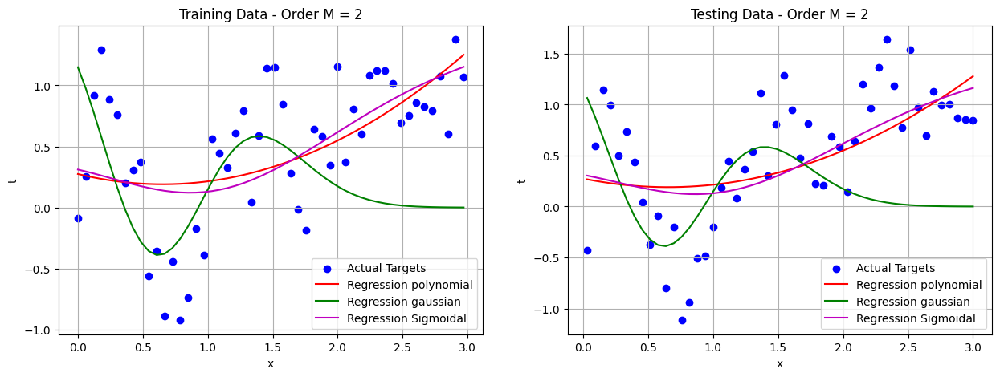

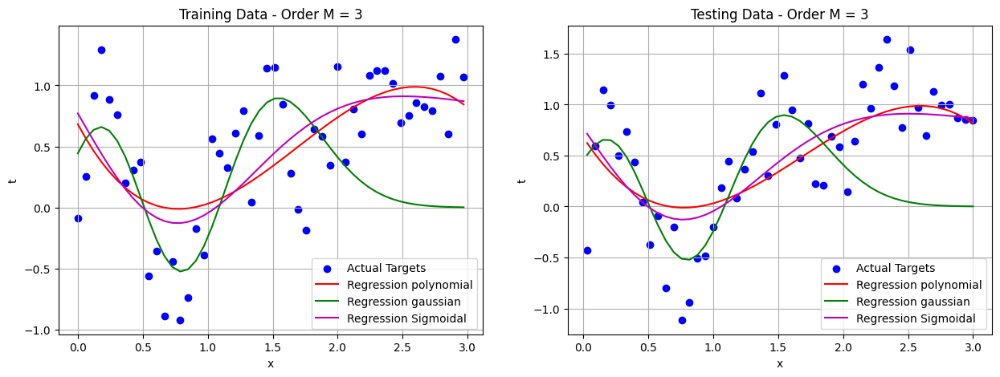

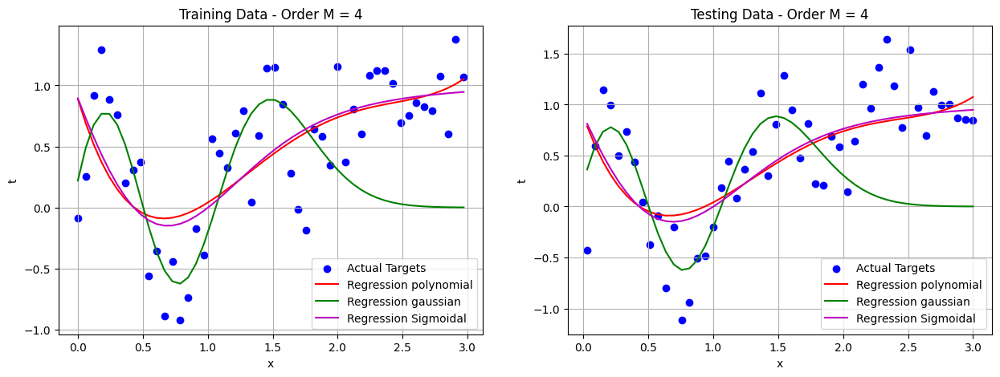

...

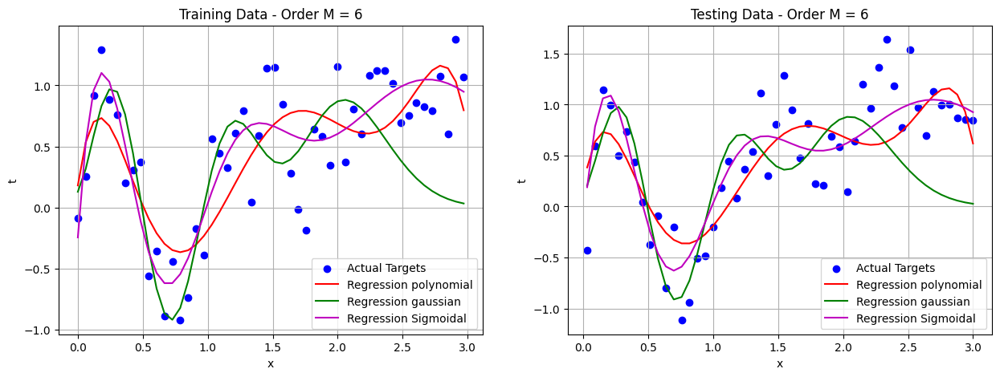

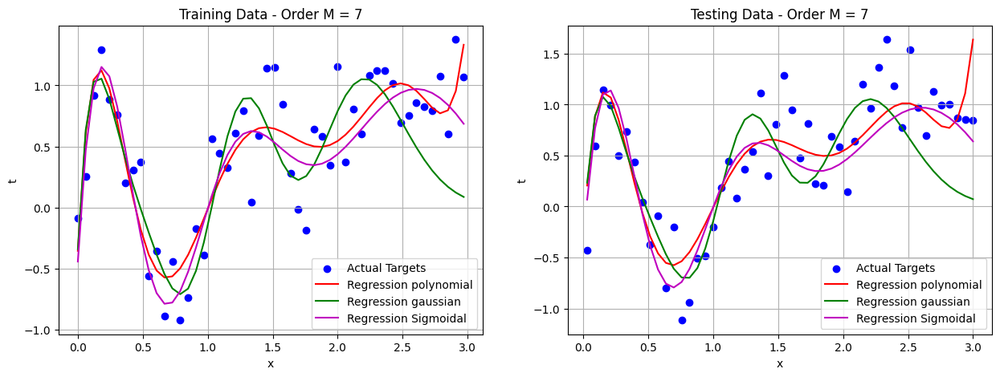

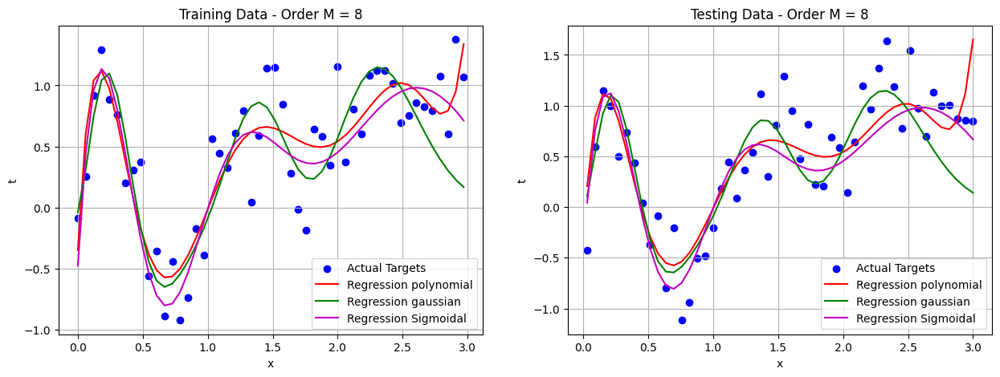

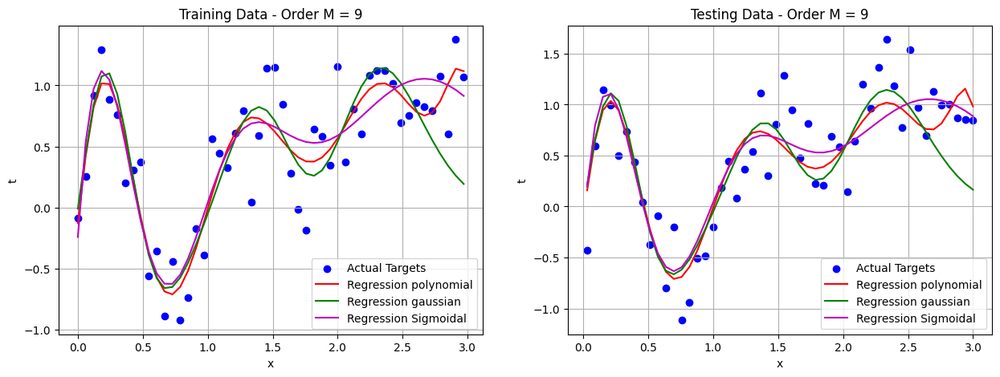

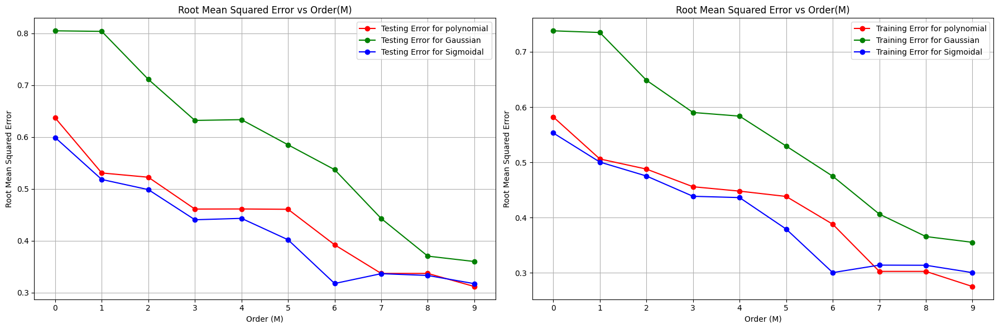

In [22]:
#Understanding the choice of kernel
########################################
#Generate 100 data points
########################################

x_values = np.linspace(0,1,100)

t_values = np.sin(2 * np.pi * x_values) + np.random.normal(0, np.sqrt(0.1), 100)

#Obtain train and test splits
#Take even samples for training and odd samples for testing

x_train_list = []
t_train_list = []

x_test_list = []
t_test_list = []
for i in range(len(x_values)):
    if i % 2 == 0:
        x_train_list.append(x_values[i])
        t_train_list.append(t_values[i])
    else:
        x_test_list.append(x_values[i])
        t_test_list.append(t_values[i])
        
x_train_3 = np.array(x_train_list)
t_test_3 = np.array(t_test_list)
t_train_3 = np.array(t_train_list)
x_test_3 = np.array(x_test_list)

sigma = 0.5 #set the value of sigma here

s = 0.8 #set the s value here

#Function to estimate the parameters
def KernelRegressionFit(X_train,Y_train,kernelType,M,lamda): #(training data, training targets, type of kernel, regularization coefficient)
  
    u = np.linspace(0, 1, M+1)
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #print(X_train.shape)
    #X_train = np.reshape(X_train, (1,-1))
    #Y_train = np.reshape(Y_train, (1,-1))
    X = []
    if kernelType=='polynomial':
      #Use polynomial kernel to transform the data
      X = np.column_stack([X_train ** i for i in range(M + 1)])

      
    if kernelType=='gaussian':
      
      for i in range(len(X_train)):
        # Calculate the Gaussian kernel transformation for the current data point
        kernel_values = [np.e**(-((X_train[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
    
        # Append the kernel values as a row to the list
        X.append(kernel_values)

      # Convert the list of lists into a numpy array to form the feature matrix X
      X = np.array(X)


    if kernelType=='sigmoidal':
      
      #Use Sigmoid kernel to transform the data
      for i in range(len(X_train)):
        kernel_values = [1/(1 + np.e**(-(X_train[i] - u[j])/s)) for j in range(M + 1)]
        
        X.append(kernel_values)
        
      X = np.array(X)

    w_opt = np.linalg.inv(X.T @ X + lamda*np.eye(M+1)) @ X.T @ Y_train

    #Return the estimated weights
    return w_opt


def KernelRegressionPred(w_est, X_train, X_test, kernelType):
  
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    
    M = len(w_est)-1
    u = np.linspace(0, 1, M+1)
    if kernelType=='polynomial':
      #Use polynomial kernel to transform the data
      # Estimate the targets for both training and testing data
      Y_train_pred = np.dot(np.column_stack([X_train ** i for i in range(M+1)]), w_est)
      Y_test_pred = np.dot(np.column_stack([X_test ** i for i in range(M+1)]), w_est)

    if kernelType=='gaussian':
      temp_train = []
      temp_test = []
      #Use Gaussian kernel to transform the data
      # Estimate the targets for both training and testing data
      for i in range(len(X_train)):
        kernel_values = [np.e**(-((X_train[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
        
        temp_train.append(kernel_values)
        
      temp_train = np.array(temp_train)
        
      Y_train_pred = np.dot(temp_train, w_est)
      
      for i in range(len(X_test)):
        kernel_values = [np.e**(-((X_test[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
        
        temp_test.append(kernel_values)
        
      temp_test = np.array(temp_test)
        
      Y_test_pred = np.dot(temp_test, w_est)

    if kernelType=='sigmoidal':
      temp_train=[]
      temp_test=[]
      #Use Sigmoid kernel to transform the data
      for i in range(len(X_train)):
        kernel_values = [1/(1 + np.e**(-(X_train[i] - u[j])/s)) for j in range(M + 1)]
        
        temp_train.append(kernel_values)
        
      temp_train = np.array(temp_train)
        
      Y_train_pred = np.dot(temp_train, w_est)
      
      for i in range(len(X_test)):
        kernel_values = [1/(1 + np.e**(-(X_test[i] - u[j])/s)) for j in range(M + 1)]
        
        temp_test.append(kernel_values)
        
      temp_test = np.array(temp_test)
        
      Y_test_pred = np.dot(temp_test, w_est)

      
    return Y_train_pred, Y_test_pred


#Function to compute the training and testing errors from the current weight estimates
def KernelRegressionPred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType):
   
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    
    M = len(w_est)-1
    u = np.linspace(0, 1, M+1)
    if kernelType=='polynomial':
      #Use polynomial kernel to transform the data
      # Estimate the targets for both training and testing data
      Y_train_pred = np.dot(np.column_stack([X_train ** i for i in range(M+1)]), w_est)
      Y_test_pred = np.dot(np.column_stack([X_test ** i for i in range(M+1)]), w_est)

      # Calculate root mean squared error
      TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
      TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))

    if kernelType=='gaussian':
      temp_train = []
      temp_test = []
      #Use Gaussian kernel to transform the data
      # Estimate the targets for both training and testing data
      for i in range(len(X_train)):
        kernel_values = [np.e**(-((X_train[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
        
        temp_train.append(kernel_values)
        
      temp_train = np.array(temp_train)
        
      Y_train_pred = np.dot(temp_train, w_est)
      
      for i in range(len(X_test)):
        kernel_values = [np.e**(-((X_test[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
        
        temp_test.append(kernel_values)
        
      temp_test = np.array(temp_test)
        
      Y_test_pred = np.dot(temp_test, w_est)

      # Calculate root mean squared error
      TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
      TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))

    if kernelType=='sigmoidal':
      temp_train=[]
      temp_test=[]
      #Use Sigmoid kernel to transform the data
      for i in range(len(X_train)):
        kernel_values = [1/(1 + np.e**(-(X_train[i] - u[j])/s)) for j in range(M + 1)]
        
        temp_train.append(kernel_values)
        
      temp_train = np.array(temp_train)
        
      Y_train_pred = np.dot(temp_train, w_est)
      
      for i in range(len(X_test)):
        kernel_values = [1/(1 + np.e**(-(X_test[i] - u[j])/s)) for j in range(M + 1)]
        
        temp_test.append(kernel_values)
        
      temp_test = np.array(temp_test)
        
      Y_test_pred = np.dot(temp_test, w_est)

      # Calculate root mean squared error
      TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
      TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))


    return TrainError,TestError


#Iterate through range of M values
M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

for M in M_range:
    #Fit Mth order polynomial using three kernels i.e {Polynomial,Gaussian,Sigmoid}
    w_opt_poly = KernelRegressionFit(x_train_3, t_train_3, 'polynomial', M, 0)
    w_opt_gaus = KernelRegressionFit(x_train_3, t_train_3, 'gaussian', M, 0)
    w_opt_sigm = KernelRegressionFit(x_train_3, t_train_3, 'sigmoidal', M, 0)

    #Predict training and testing targets using estimated w
    Y_train_pred_p, Y_test_pred_p = KernelRegressionPred(w_opt_poly, x_train_3, x_test_3, 'polynomial')
    Y_train_pred_g, Y_test_pred_g = KernelRegressionPred(w_opt_gaus, x_train_3, x_test_3, 'gaussian')
    Y_train_pred_s, Y_test_pred_s = KernelRegressionPred(w_opt_sigm, x_train_3, x_test_3, 'sigmoidal')

    #Predict errors on both training and testing data using estimated w
    TrainError_p, TestError_p = KernelRegressionPred_Error(w_opt_poly, x_train_3, t_train_3, x_test_3, t_test_3, 'polynomial')
    TrainError_g, TestError_g = KernelRegressionPred_Error(w_opt_gaus, x_train_3, t_train_3, x_test_3, t_test_3, 'gaussian')
    TrainError_s, TestError_s = KernelRegressionPred_Error(w_opt_sigm, x_train_3, t_train_3, x_test_3, t_test_3, 'sigmoidal')

    #Store them for plotting
    polynomial_tr_error.append(TrainError_p)
    polynomial_te_error.append(TestError_p)
    gaussian_tr_error.append(TrainError_g)
    gaussian_te_error.append(TestError_g)
    sigmoid_tr_error.append(TrainError_s)
    sigmoid_te_error.append(TestError_s)
    
    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train_3, t_train_3, color='blue', label='Actual Targets')
    plt.plot(x_train_3, Y_train_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_train_3, Y_train_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_train_3, Y_train_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Training Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)
    
    # Plot testing data 
    plt.subplot(1, 2, 2)
    plt.scatter(x_test_3, t_test_3, color='blue', label='Actual Targets')
    plt.plot(x_test_3, Y_test_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_test_3, Y_test_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_test_3, Y_test_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Testing Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)
  
    

#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels

# Create a single figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot testing error 
ax1.plot(M_range, polynomial_te_error, marker='o', color='red', label='Testing Error for polynomial')
ax1.plot(M_range, gaussian_te_error, marker='o', color='green', label='Testing Error for Gaussian')
ax1.plot(M_range, sigmoid_te_error, marker='o', color='blue', label='Testing Error for Sigmoidal')
ax1.set_title('Root Mean Squared Error vs Order(M)')
ax1.set_xlabel('Order (M)')
ax1.set_ylabel('Root Mean Squared Error')
ax1.set_xticks(M_range)
ax1.legend()
ax1.grid(True)

#plot training error
ax2.plot(M_range, polynomial_tr_error, marker='o', color='red', label='Training Error for polynomial')
ax2.plot(M_range, gaussian_tr_error, marker='o', color='green', label='Training Error for Gaussian')
ax2.plot(M_range, sigmoid_tr_error, marker='o', color='blue', label='Training Error for Sigmoidal')
ax2.set_title('Root Mean Squared Error vs Order(M)')
ax2.set_xlabel('Order (M)')
ax2.set_ylabel('Root Mean Squared Error')
ax2.set_xticks(M_range)
ax2.legend()
ax2.grid(True)


plt.tight_layout()
plt.show()



########################################
#Repeat the experiments by changing target function
########################################


x_values = np.linspace(0,3,100)

# Calculate corresponding t values with noise

t_values = []
en = np.random.normal(0, np.sqrt(0.1), 100)
u = 2.5
i=0
j=0
sigma_value = 0.8

for value in x_values:
  if 0<=value<1 :
    t_values.append(np.sin(2 * np.pi * value) + en[i])
  
  elif 1<=value<2 :
    if 1<=value<1.5:
      t_values.append(2*value - 2 + en[i])
    else:
      t_values.append((-2)*value + 4 + en[i])
      
  else:
    t_values.append(np.e**(-((value - u)**2)/(2*sigma_value**2)) + en[i])
    j+=1
    
  i+=1
    
x_train_list = []
t_train_list = []

x_test_list = []
t_test_list = []

i=0
for i in range(len(x_values)):
    if i % 2 == 0:
        x_train_list.append(x_values[i])
        t_train_list.append(t_values[i])
    else:
        x_test_list.append(x_values[i])
        t_test_list.append(t_values[i])


x_train_4 = np.array(x_train_list)
t_test_4 = np.array(t_test_list)
t_train_4 = np.array(t_train_list)
x_test_4 = np.array(x_test_list)


sigma = 0.5 #set the value of sigma here

s = 0.8 #set the s value here

#Iterate through range of M values
M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

print('-------FOR THE MODIFIED TARGET FUNCTION-------4')

for M in M_range:
    #Fit Mth order polynomial using three kernels i.e {Polynomial,Gaussian,Sigmoid}
    w_opt_poly = KernelRegressionFit(x_train_4, t_train_4, 'polynomial', M, 0)
    w_opt_gaus = KernelRegressionFit(x_train_4, t_train_4, 'gaussian', M, 0)
    w_opt_sigm = KernelRegressionFit(x_train_4, t_train_4, 'sigmoidal', M, 0)

    #Predict training and testing targets using estimated w
    Y_train_pred_p, Y_test_pred_p = KernelRegressionPred(w_opt_poly, x_train_4, x_test_4, 'polynomial')
    Y_train_pred_g, Y_test_pred_g = KernelRegressionPred(w_opt_gaus, x_train_4, x_test_4, 'gaussian')
    Y_train_pred_s, Y_test_pred_s = KernelRegressionPred(w_opt_sigm, x_train_4, x_test_4, 'sigmoidal')

    #Predict errors on both training and testing data using estimated w
    TrainError_p, TestError_p = KernelRegressionPred_Error(w_opt_poly, x_train_4, t_train_4, x_test_4, t_test_4, 'polynomial')
    TrainError_g, TestError_g = KernelRegressionPred_Error(w_opt_gaus, x_train_4, t_train_4, x_test_4, t_test_4, 'gaussian')
    TrainError_s, TestError_s = KernelRegressionPred_Error(w_opt_sigm, x_train_4, t_train_4, x_test_4, t_test_4, 'sigmoidal')

    #Store them for plotting
    polynomial_tr_error.append(TrainError_p)
    polynomial_te_error.append(TestError_p)
    gaussian_tr_error.append(TrainError_g)
    gaussian_te_error.append(TestError_g)
    sigmoid_tr_error.append(TrainError_s)
    sigmoid_te_error.append(TestError_s)
    
    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train_4, t_train_4, color='blue', label='Actual Targets')
    plt.plot(x_train_4, Y_train_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_train_4, Y_train_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_train_4, Y_train_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Training Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)
    
    # Plot testing data 
    plt.subplot(1, 2, 2)
    plt.scatter(x_test_4, t_test_4, color='blue', label='Actual Targets')
    plt.plot(x_test_4, Y_test_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_test_4, Y_test_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_test_4, Y_test_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Testing Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(True)
    

#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels

# Create a single figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot testing error 
ax1.plot(M_range, polynomial_te_error, marker='o', color='red', label='Testing Error for polynomial')
ax1.plot(M_range, gaussian_te_error, marker='o', color='green', label='Testing Error for Gaussian')
ax1.plot(M_range, sigmoid_te_error, marker='o', color='blue', label='Testing Error for Sigmoidal')
ax1.set_title('Root Mean Squared Error vs Order(M)')
ax1.set_xlabel('Order (M)')
ax1.set_ylabel('Root Mean Squared Error')
ax1.set_xticks(M_range)
ax1.legend()
ax1.grid(True)

#plot training error
ax2.plot(M_range, polynomial_tr_error, marker='o', color='red', label='Training Error for polynomial')
ax2.plot(M_range, gaussian_tr_error, marker='o', color='green', label='Training Error for Gaussian')
ax2.plot(M_range, sigmoid_tr_error, marker='o', color='blue', label='Training Error for Sigmoidal')
ax2.set_title('Root Mean Squared Error vs Order(M)')
ax2.set_xlabel('Order (M)')
ax2.set_ylabel('Root Mean Squared Error')
ax2.set_xticks(M_range)
ax2.legend()
ax2.grid(True)


plt.tight_layout()
plt.show()










<b> Observations </b>

1. All 3 of the kernels seem to perform well for the first function. The best regression fit is observed at M=5 where the regression curves of all the kernels seem to overlap.

2. For the first function, the error gradually decreases over M but overshoots at the end for gaussian kernel.

3. For the step function, due to its complexity, the curves are best fitted for higher values of M. Also the gaussian curve seems to adapt quickly among all.

4. The RMS errors of all the kernels decrease gradually over M for both training and testing datasets. Gaussian gives slightly higher error than the other two.


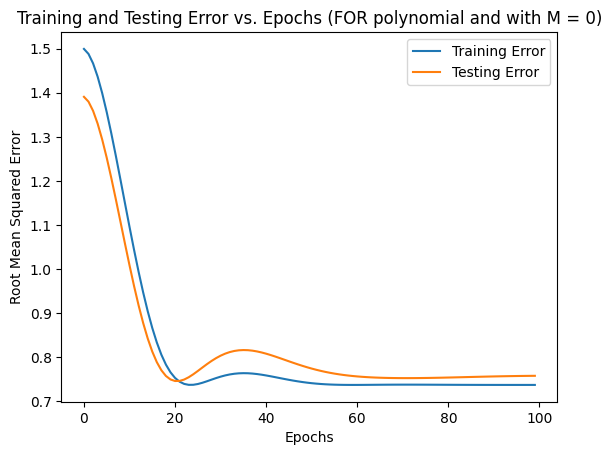

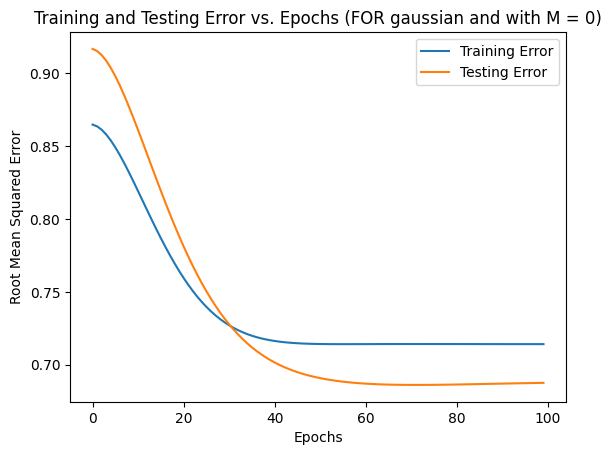

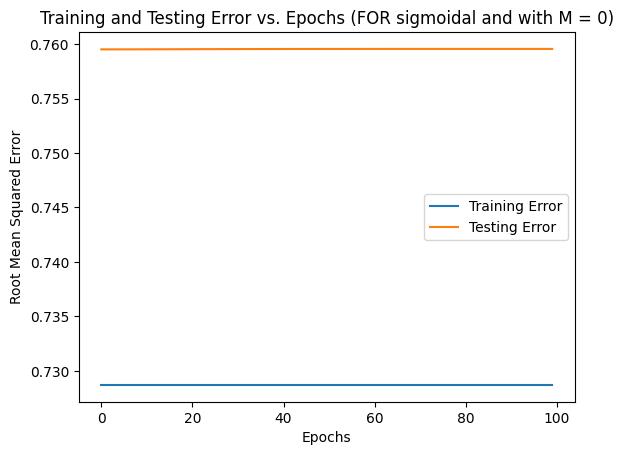

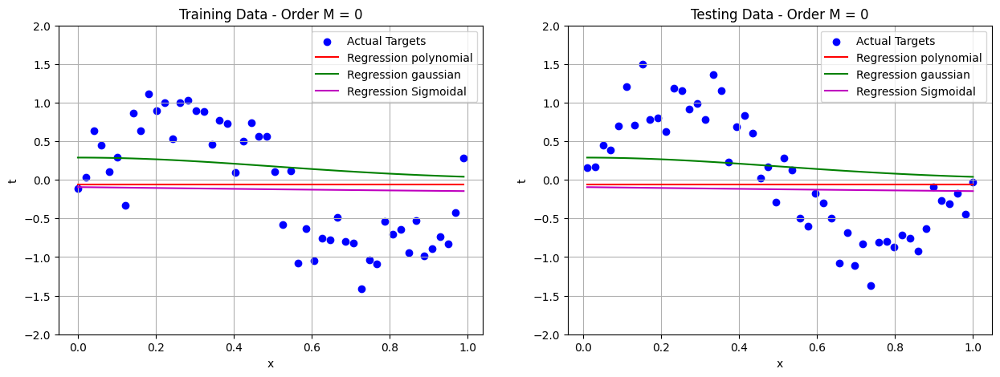

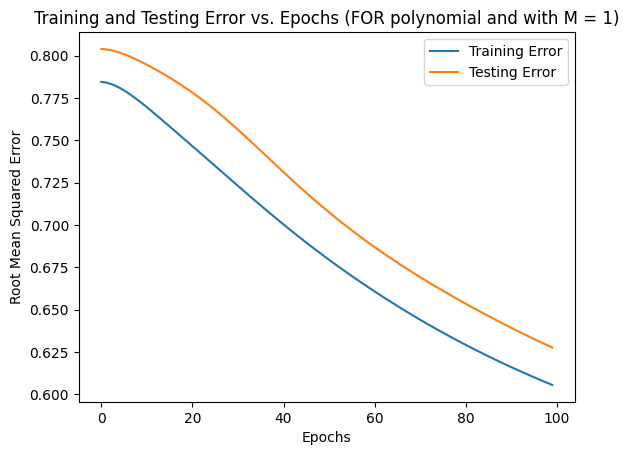

...

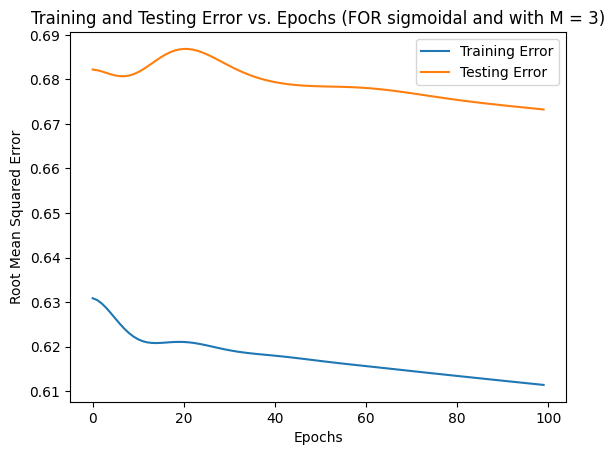

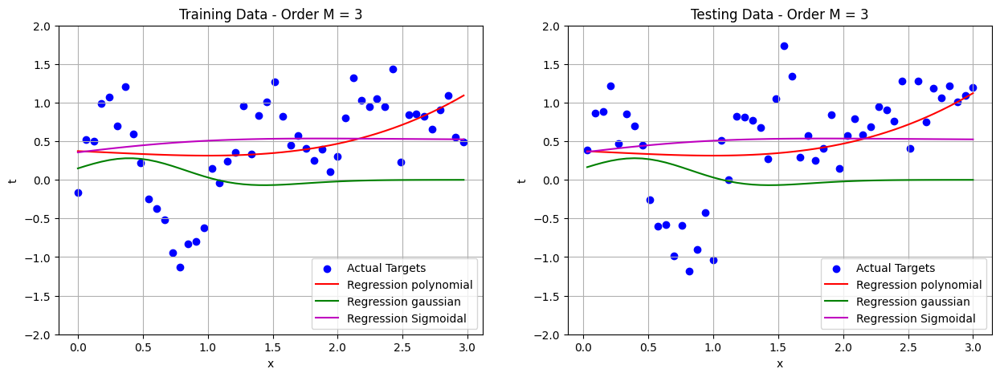

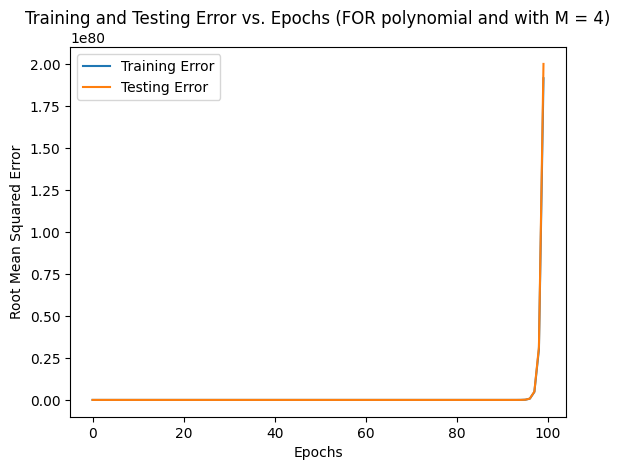

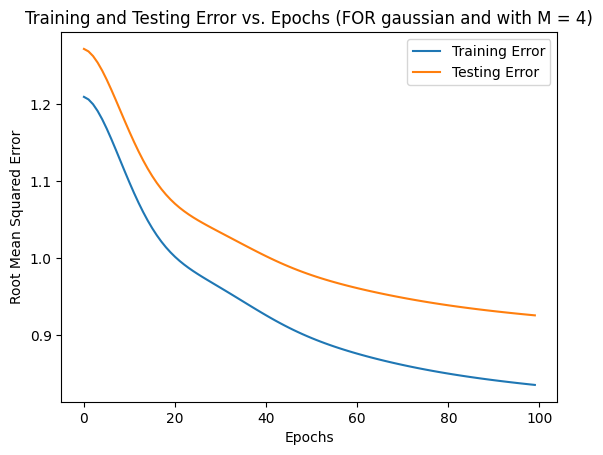

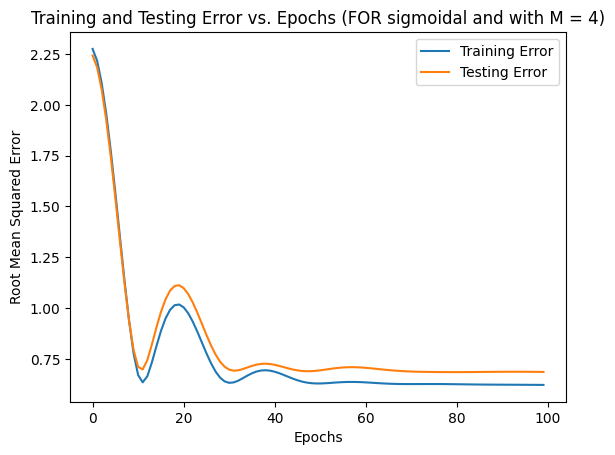

C:\Users\Siddhesh\AppData\Local\Temp\ipykernel_3104\1020084989.py:23: RuntimeWarning: overflow encountered in square
  TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
C:\Users\Siddhesh\AppData\Local\Temp\ipykernel_3104\1020084989.py:24: RuntimeWarning: overflow encountered in square
  TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))


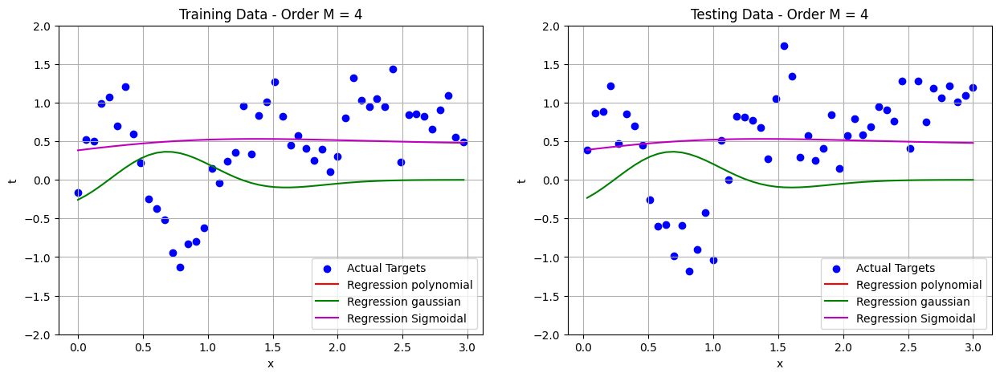

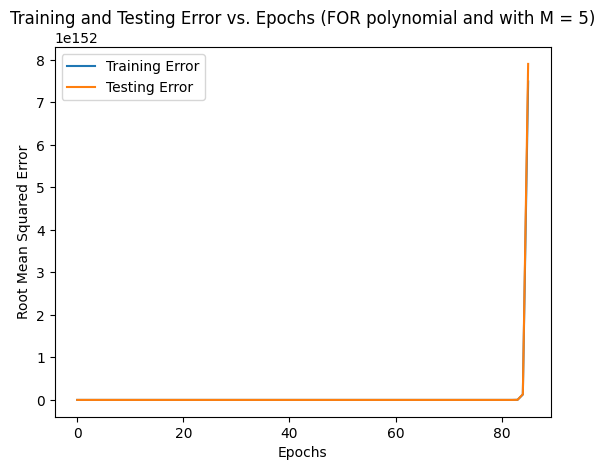

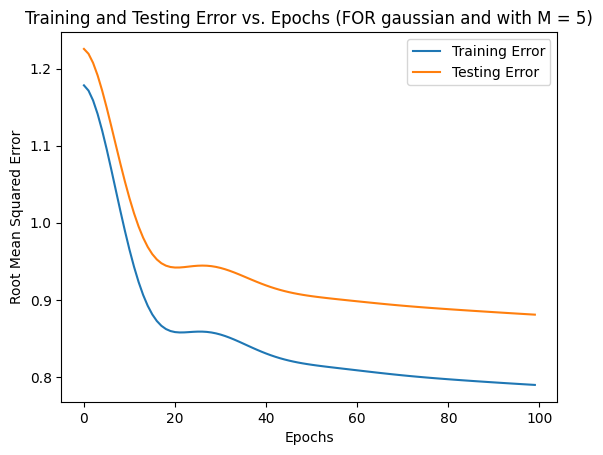

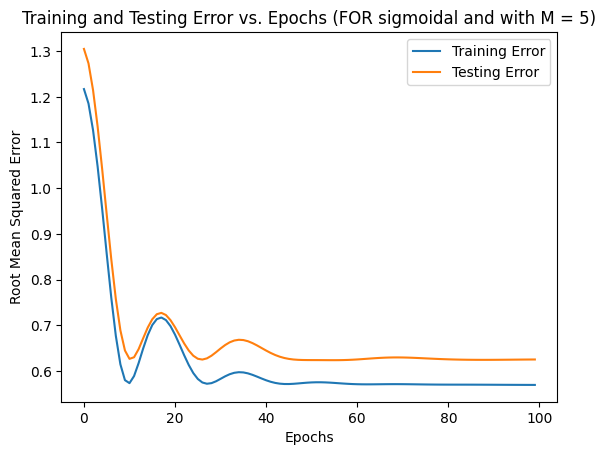

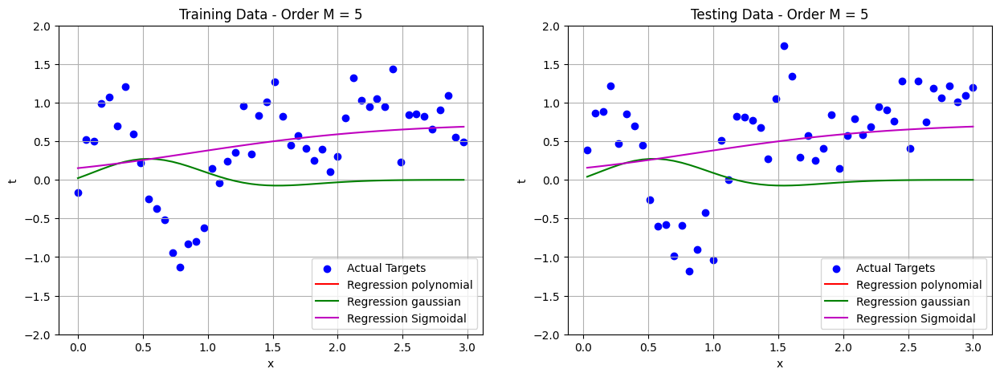

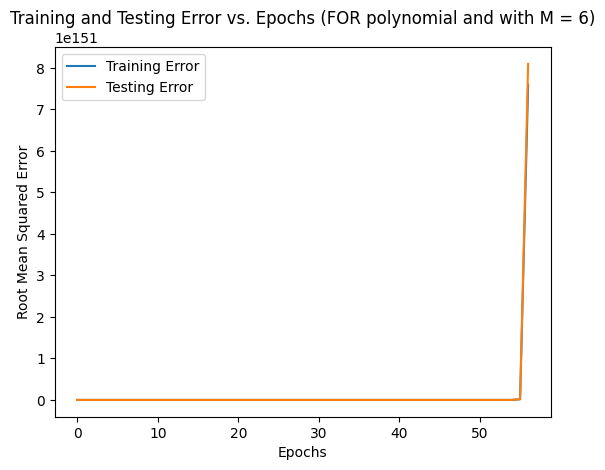

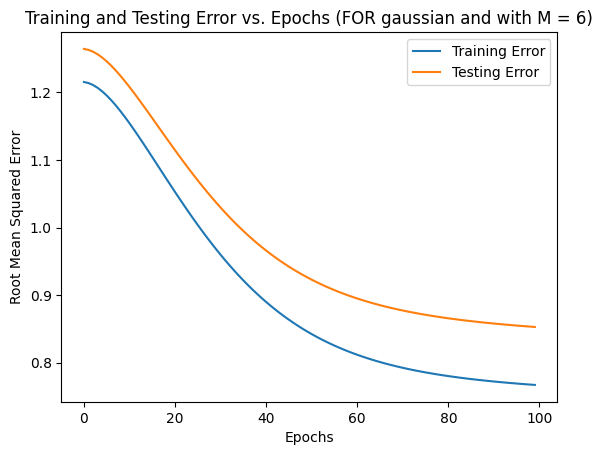

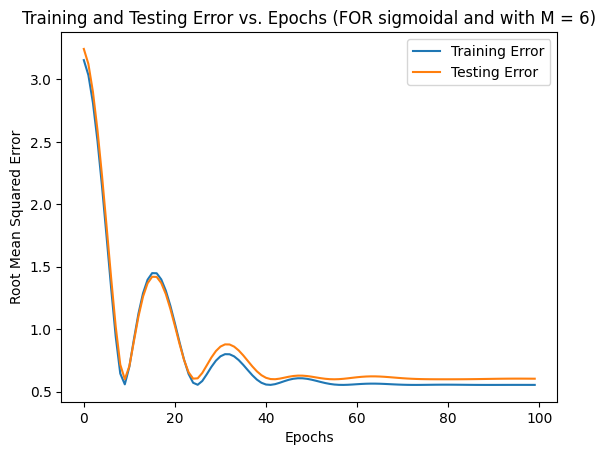

C:\Users\Siddhesh\AppData\Local\Temp\ipykernel_3104\1020084989.py:126: RuntimeWarning: overflow encountered in multiply
  gradient = 2 * np.dot(X_tr.T, Y_pred - Y_batch) / len(X_batch)


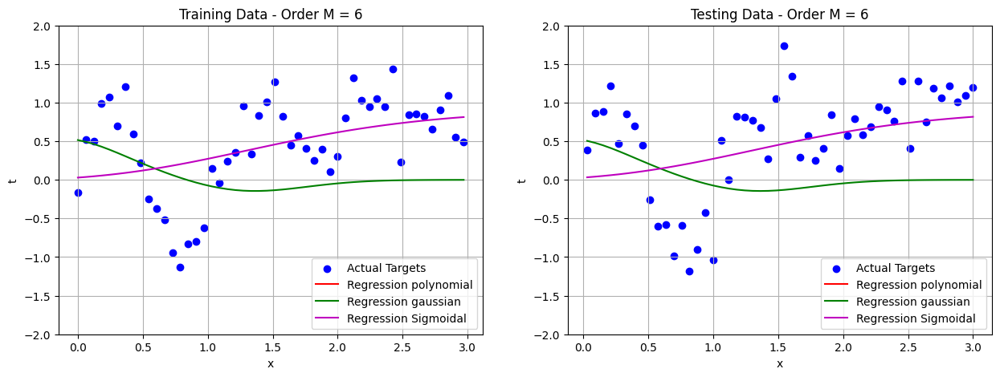

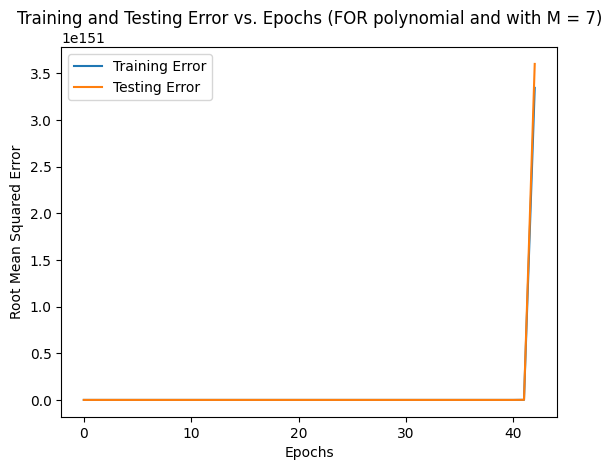

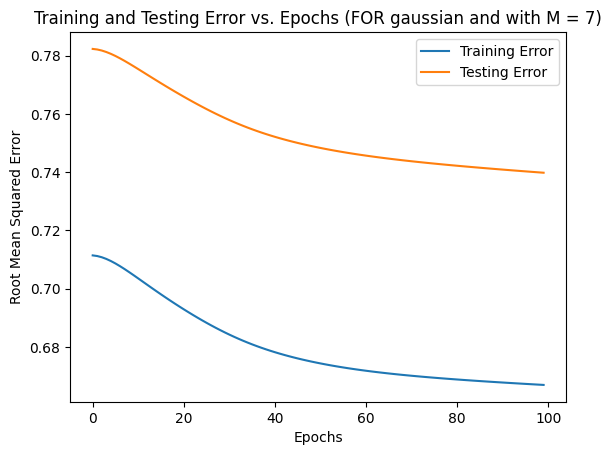

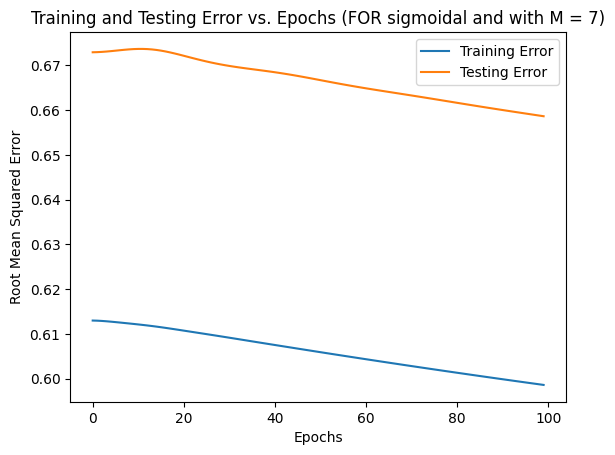

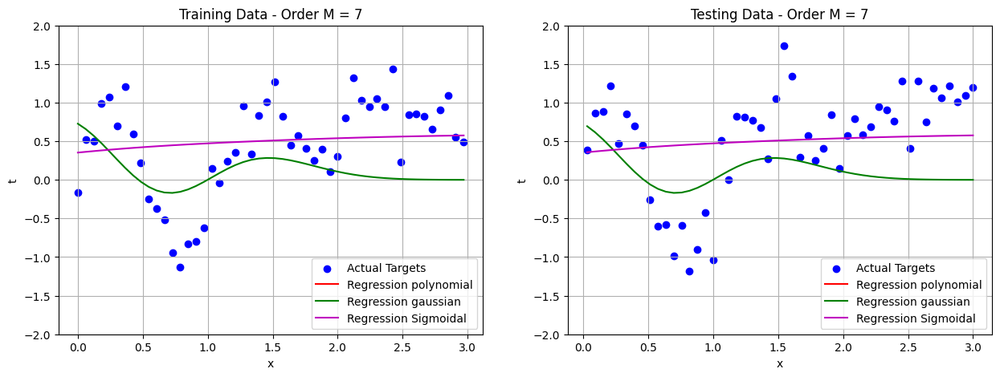

...

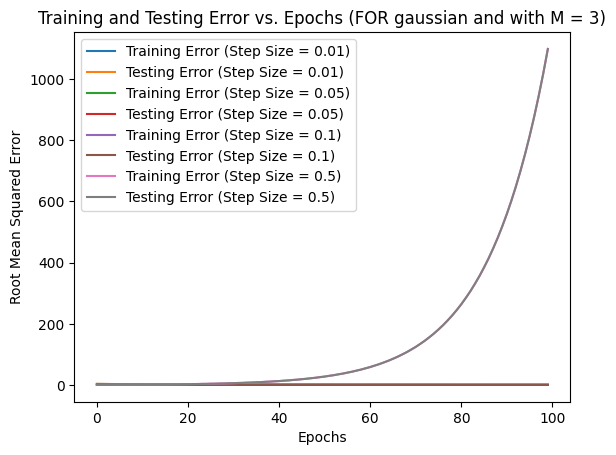

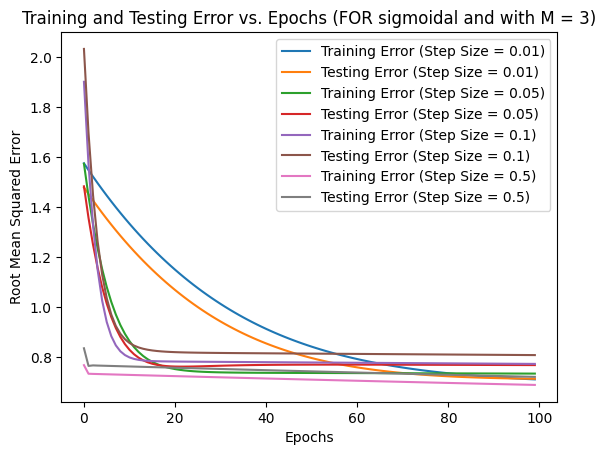

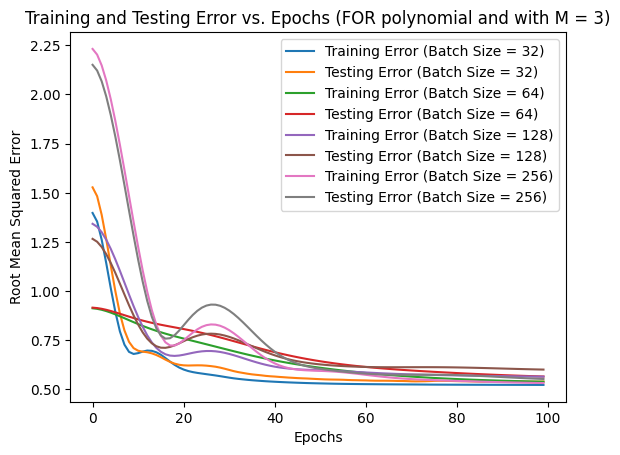

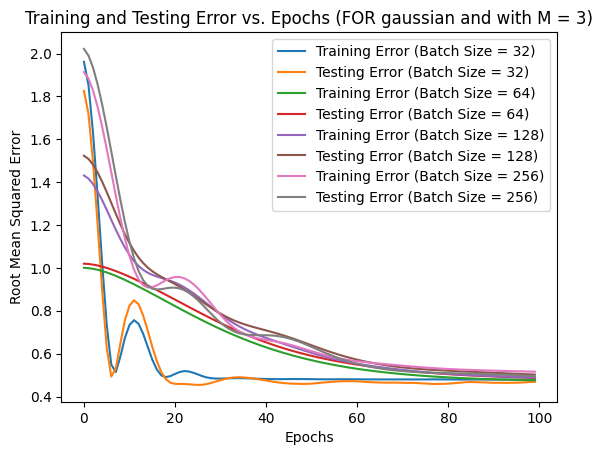

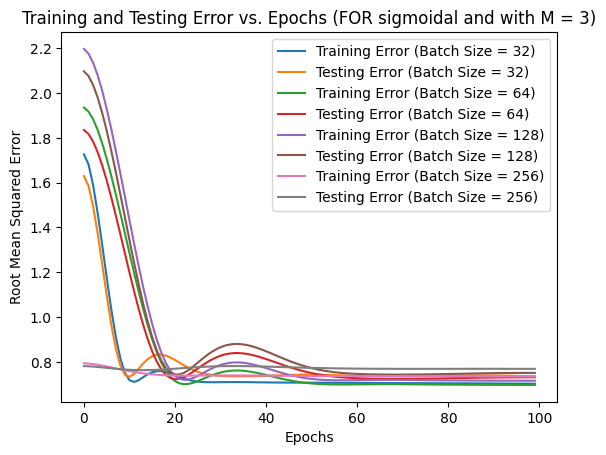

In [23]:
#Understanding online training
########################################
#Repeat 3(a) and 3(b) using stochastic gradient descent for weight update ( plot required results )
########################################

sigma = 0.5 #set the value of sigma here

s = 0.8 #set the s value here

def ErrorPred(w_est,X_train,Y_train,X_test,Y_test,kernelType):
   
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    
    M = len(w_est)-1
    u = np.linspace(0, 1, M+1)
    if kernelType=='polynomial':
      #Use polynomial kernel to transform the data
      # Estimate the targets for both training and testing data
      Y_train_pred = np.dot(np.column_stack([X_train ** i for i in range(M+1)]), w_est)
      Y_test_pred = np.dot(np.column_stack([X_test ** i for i in range(M+1)]), w_est)

      # Calculate root mean squared error
      TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
      TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))

    if kernelType=='gaussian':
      temp_train = []
      temp_test = []
      #Use Gaussian kernel to transform the data
      # Estimate the targets for both training and testing data
      for i in range(len(X_train)):
        kernel_values = [np.e**(-((X_train[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
        
        temp_train.append(kernel_values)
        
      temp_train = np.array(temp_train)
        
      Y_train_pred = np.dot(temp_train, w_est)
      
      for i in range(len(X_test)):
        kernel_values = [np.e**(-((X_test[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
        
        temp_test.append(kernel_values)
        
      temp_test = np.array(temp_test)
        
      Y_test_pred = np.dot(temp_test, w_est)

      # Calculate root mean squared error
      TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
      TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))

    if kernelType=='sigmoidal':
      temp_train=[]
      temp_test=[]
      #Use Sigmoid kernel to transform the data
      for i in range(len(X_train)):
        kernel_values = [1/(1 + np.e**(-(X_train[i] - u[j])/s)) for j in range(M + 1)]
        
        temp_train.append(kernel_values)
        
      temp_train = np.array(temp_train)
        
      Y_train_pred = np.dot(temp_train, w_est)
      
      for i in range(len(X_test)):
        kernel_values = [1/(1 + np.e**(-(X_test[i] - u[j])/s)) for j in range(M + 1)]
        
        temp_test.append(kernel_values)
        
      temp_test = np.array(temp_test)
        
      Y_test_pred = np.dot(temp_test, w_est)

      # Calculate root mean squared error
      TrainError = np.sqrt(np.mean((Y_train - Y_train_pred) ** 2))
      TestError = np.sqrt(np.mean((Y_test - Y_test_pred) ** 2))

    return TrainError, TestError, Y_train_pred, Y_test_pred


def OnlineTraining(X_train,Y_train,X_test, Y_test, kernelType,M,Epochs,BatchSize,stepSize): 
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the weights
    weights = np.random.randn(M+1)
    
    u = np.linspace(0, 1, M+1)

    #Initialize the necessary variables
    running_mean_gradient = np.zeros_like(weights)
    train_errors = []
    test_errors = []
    epochs = range(Epochs)
    for epoch in epochs:
        tr_err, te_err, a, b = ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType)
        train_errors.append(tr_err)
        test_errors.append(te_err)

        #Shuffle the data
        indices = np.random.permutation(len(X_train))
        X_train_shuffled = X_train[indices]
        Y_train_shuffled = Y_train[indices]

        #Iterate through the batches
        for i in range(0, len(X_train), BatchSize):
            X_batch = X_train_shuffled[i:i+BatchSize]
            Y_batch = Y_train_shuffled[i:i+BatchSize]

            #Obtain kernel representation
            X_tr = []
            if kernelType=='polynomial':
                X_tr = np.column_stack([X_batch ** i for i in range(M + 1)])
            elif kernelType=='gaussian':
                for i in range(len(X_batch)):
                    kernel_values = [np.e**(-((X_batch[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
                    X_tr.append(kernel_values)
                X_tr = np.array(X_tr)
            elif kernelType=='sigmoidal':
                for i in range(len(X_batch)):
                    kernel_values = [1/(1 + np.e**(-(X_batch[i] - u[j])/s)) for j in range(M + 1)]
                    X_tr.append(kernel_values)
                X_tr = np.array(X_tr)

            #Compute the gradient of weights
            Y_pred = np.dot(X_tr, weights)
            gradient = 2 * np.dot(X_tr.T, Y_pred - Y_batch) / len(X_batch)

            # Update the running mean of gradients
            running_mean_gradient = 0.9 * running_mean_gradient + 0.1 * gradient 

            #Update the weights using mean gradient
            weights -= stepSize * running_mean_gradient

    #Plot training and testing error across the epochs
    plt.figure()
    plt.plot(epochs, train_errors, label='Training Error')
    plt.plot(epochs, test_errors, label='Testing Error')
    plt.xlabel('Epochs')
    plt.ylabel('Root Mean Squared Error')
    plt.title(f'Training and Testing Error vs. Epochs (FOR {kernelType} and with M = {M})')
    plt.legend()
    plt.show()

    return weights

def OnlinePred(w_est,X_train, Y_train, X_test, Y_test, kernelType): 
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    a, b, Y_train_pred, Y_test_pred = ErrorPred(w_est, X_train, Y_train, X_test, Y_test, kernelType)
    return Y_train_pred, Y_test_pred

def OnlinePred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType): 
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    Y_tr_error, Y_te_error, a, b = ErrorPred(w_est, X_train, Y_train, X_test, Y_test, kernelType)
    return Y_tr_error, Y_te_error

##################################################
#Repeat 3a with online training
##################################################

#Obtian train and test splits
#Take even samples for training and odd samples for testing

x_values = np.linspace(0,1,100)

t_values = np.sin(2 * np.pi * x_values) + np.random.normal(0, np.sqrt(0.1), 100)

x_train_list = []
t_train_list = []

x_test_list = []
t_test_list = []
for i in range(len(x_values)):
    if i % 2 == 0:
        x_train_list.append(x_values[i])
        t_train_list.append(t_values[i])
    else:
        x_test_list.append(x_values[i])
        t_test_list.append(t_values[i])
        
x_train_5 = np.array(x_train_list)
t_test_5 = np.array(t_test_list)
t_train_5 = np.array(t_train_list)
x_test_5 = np.array(x_test_list)

#Iterate through range of M values
M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

for M in M_range:
    # Fit Mth order polynomial using three kernels i.e {Polynomial, Gaussian, Sigmoid}
    w_opt_poly = np.zeros(M + 1)  # Initialize weights for polynomial kernel
    w_opt_gaus = np.zeros(M + 1)  # Initialize weights for Gaussian kernel
    w_opt_sigm = np.zeros(M + 1)  # Initialize weights for Sigmoidal kernel

    # Initialize variables for storing training and testing predictions
    Y_train_pred_p = np.zeros_like(t_train_5)
    Y_test_pred_p = np.zeros_like(t_test_5)
    Y_train_pred_g = np.zeros_like(t_train_5)
    Y_test_pred_g = np.zeros_like(t_test_5)
    Y_train_pred_s = np.zeros_like(t_train_5)
    Y_test_pred_s = np.zeros_like(t_test_5)

    # Initialize variables for storing training and testing errors
    TrainError_p = 0
    TestError_p = 0
    TrainError_g = 0
    TestError_g = 0
    TrainError_s = 0
    TestError_s = 0

    # Perform online training for each kernel type
    w_opt_poly = OnlineTraining(x_train_5, t_train_5, x_test_5, t_test_5, 'polynomial', M, 100, 64, 0.05)
    w_opt_gaus = OnlineTraining(x_train_5, t_train_5, x_test_5, t_test_5, 'gaussian', M, 100, 64, 0.05)
    w_opt_sigm = OnlineTraining(x_train_5, t_train_5, x_test_5, t_test_5, 'sigmoidal', M, 100, 64, 0.05)

    # Predict training and testing targets using estimated weights
    Y_train_pred_p, Y_test_pred_p = OnlinePred(w_opt_poly, x_train_5, t_train_5, x_test_5, t_test_5, 'polynomial')
    Y_train_pred_g, Y_test_pred_g = OnlinePred(w_opt_gaus, x_train_5, t_train_5, x_test_5, t_test_5, 'gaussian')
    Y_train_pred_s, Y_test_pred_s = OnlinePred(w_opt_sigm, x_train_5, t_train_5, x_test_5, t_test_5, 'sigmoidal')

    # Predict errors on both training and testing data using estimated weights
    TrainError_p, TestError_p = OnlinePred_Error(w_opt_poly, x_train_5, t_train_5, x_test_5, t_test_5, 'polynomial')
    TrainError_g, TestError_g = OnlinePred_Error(w_opt_gaus, x_train_5, t_train_5, x_test_5, t_test_5, 'gaussian')
    TrainError_s, TestError_s = OnlinePred_Error(w_opt_sigm, x_train_5, t_train_5, x_test_5, t_test_5, 'sigmoidal')

    # Store errors for plotting
    polynomial_tr_error.append(TrainError_p)
    polynomial_te_error.append(TestError_p)
    gaussian_tr_error.append(TrainError_g)
    gaussian_te_error.append(TestError_g)
    sigmoid_tr_error.append(TrainError_s)
    sigmoid_te_error.append(TestError_s)
    
    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train_5, t_train_5, color='blue', label='Actual Targets')
    plt.plot(x_train_5, Y_train_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_train_5, Y_train_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_train_5, Y_train_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Training Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.ylim(-2,2)
    plt.legend()
    plt.grid(True)
    
    # Plot testing data 
    plt.subplot(1, 2, 2)
    plt.scatter(x_test_5, t_test_5, color='blue', label='Actual Targets')
    plt.plot(x_test_5, Y_test_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_test_5, Y_test_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_test_5, Y_test_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Testing Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.ylim(-2,2)
    plt.legend()
    plt.grid(True)
  
    

#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels

# Create a single figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot testing error 
ax1.plot(M_range, polynomial_te_error, marker='o', color='red', label='Testing Error for polynomial')
ax1.plot(M_range, gaussian_te_error, marker='o', color='green', label='Testing Error for Gaussian')
ax1.plot(M_range, sigmoid_te_error, marker='o', color='blue', label='Testing Error for Sigmoidal')
ax1.set_title('Root Mean Squared Error vs Order(M)')
ax1.set_xlabel('Order (M)')
ax1.set_ylabel('Root Mean Squared Error')
ax1.set_xticks(M_range)
ax1.legend()
ax1.grid(True)

#plot training error
ax2.plot(M_range, polynomial_tr_error, marker='o', color='red', label='Training Error for polynomial')
ax2.plot(M_range, gaussian_tr_error, marker='o', color='green', label='Training Error for Gaussian')
ax2.plot(M_range, sigmoid_tr_error, marker='o', color='blue', label='Training Error for Sigmoidal')
ax2.set_title('Root Mean Squared Error vs Order(M)')
ax2.set_xlabel('Order (M)')
ax2.set_ylabel('Root Mean Squared Error')
ax2.set_xticks(M_range)
ax2.legend()
ax2.grid(True)


plt.tight_layout()
plt.show()


##################################################
#Repeat 3b with online training
##################################################

x_values = np.linspace(0,3,100)

# Calculate corresponding t values with noise

t_values = []
en = np.random.normal(0, np.sqrt(0.1), 100)
u = 2.5
i=0
j=0
sigma_value = 0.8

for value in x_values:
  if 0<=value<1 :
    t_values.append(np.sin(2 * np.pi * value) + en[i])
  
  elif 1<=value<2 :
    if 1<=value<1.5:
      t_values.append(2*value - 2 + en[i])
    else:
      t_values.append((-2)*value + 4 + en[i])
      
  else:
    t_values.append(np.e**(-((value - u)**2)/(2*sigma_value**2)) + en[i])
    j+=1
    
  i+=1
    
x_train_list = []
t_train_list = []

x_test_list = []
t_test_list = []

i=0

for i in range(len(x_values)):
    if i % 2 == 0:
        x_train_list.append(x_values[i])
        t_train_list.append(t_values[i])
    else:
        x_test_list.append(x_values[i])
        t_test_list.append(t_values[i])


x_train_6 = np.array(x_train_list)
t_test_6 = np.array(t_test_list)
t_train_6 = np.array(t_train_list)
x_test_6 = np.array(x_test_list)


#Iterate through range of M values
M_range=list(range(10))

polynomial_tr_error = []
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error = []
sigmoid_te_error = []

for M in M_range:
    # Fit Mth order polynomial using three kernels i.e {Polynomial, Gaussian, Sigmoid}
    w_opt_poly = np.zeros(M + 1)  # Initialize weights for polynomial kernel
    w_opt_gaus = np.zeros(M + 1)  # Initialize weights for Gaussian kernel
    w_opt_sigm = np.zeros(M + 1)  # Initialize weights for Sigmoidal kernel

    # Initialize variables for storing training and testing predictions
    Y_train_pred_p = np.zeros_like(t_train_6)
    Y_test_pred_p = np.zeros_like(t_test_6)
    Y_train_pred_g = np.zeros_like(t_train_6)
    Y_test_pred_g = np.zeros_like(t_test_6)
    Y_train_pred_s = np.zeros_like(t_train_6)
    Y_test_pred_s = np.zeros_like(t_test_6)

    # Initialize variables for storing training and testing errors
    TrainError_p = 0
    TestError_p = 0
    TrainError_g = 0
    TestError_g = 0
    TrainError_s = 0
    TestError_s = 0

    # Perform online training for each kernel type
    w_opt_poly = OnlineTraining(x_train_6, t_train_6, x_test_6, t_test_6, 'polynomial', M, 100, 64, 0.05)
    w_opt_gaus = OnlineTraining(x_train_6, t_train_6, x_test_6, t_test_6, 'gaussian', M, 100, 64, 0.05)
    w_opt_sigm = OnlineTraining(x_train_6, t_train_6, x_test_6, t_test_6, 'sigmoidal', M, 100, 64, 0.05)

    # Predict training and testing targets using estimated weights
    Y_train_pred_p, Y_test_pred_p = OnlinePred(w_opt_poly, x_train_6, t_train_6, x_test_6, t_test_6, 'polynomial')
    Y_train_pred_g, Y_test_pred_g = OnlinePred(w_opt_gaus, x_train_6, t_train_6, x_test_6, t_test_6, 'gaussian')
    Y_train_pred_s, Y_test_pred_s = OnlinePred(w_opt_sigm, x_train_6, t_train_6, x_test_6, t_test_6, 'sigmoidal')

    # Predict errors on both training and testing data using estimated weights
    TrainError_p, TestError_p = OnlinePred_Error(w_opt_poly, x_train_6, t_train_6, x_test_6, t_test_6, 'polynomial')
    TrainError_g, TestError_g = OnlinePred_Error(w_opt_gaus, x_train_6, t_train_6, x_test_6, t_test_6, 'gaussian')
    TrainError_s, TestError_s = OnlinePred_Error(w_opt_sigm, x_train_6, t_train_6, x_test_6, t_test_6, 'sigmoidal')

    # Store errors for plotting
    polynomial_tr_error.append(TrainError_p)
    polynomial_te_error.append(TestError_p)
    gaussian_tr_error.append(TrainError_g)
    gaussian_te_error.append(TestError_g)
    sigmoid_tr_error.append(TrainError_s)
    sigmoid_te_error.append(TestError_s)
    
    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(x_train_6, t_train_6, color='blue', label='Actual Targets')
    plt.plot(x_train_6, Y_train_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_train_6, Y_train_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_train_6, Y_train_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Training Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.ylim(-2,2)
    plt.legend()
    plt.grid(True)
    
    # Plot testing data 
    plt.subplot(1, 2, 2)
    plt.scatter(x_test_6, t_test_6, color='blue', label='Actual Targets')
    plt.plot(x_test_6, Y_test_pred_p, color='red', label='Regression polynomial')
    plt.plot(x_test_6, Y_test_pred_g, color='green', label='Regression gaussian')
    plt.plot(x_test_6, Y_test_pred_s, color='m', label='Regression Sigmoidal')
    plt.title(f'Testing Data - Order M = {M}')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.ylim(-2,2)
    plt.legend()
    plt.grid(True)
  
    

#Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels

# Create a single figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot testing error 
ax1.plot(M_range, polynomial_te_error, marker='o', color='red', label='Testing Error for polynomial')
ax1.plot(M_range, gaussian_te_error, marker='o', color='green', label='Testing Error for Gaussian')
ax1.plot(M_range, sigmoid_te_error, marker='o', color='blue', label='Testing Error for Sigmoidal')
ax1.set_title('Root Mean Squared Error vs Order(M)')
ax1.set_xlabel('Order (M)')
ax1.set_ylabel('Root Mean Squared Error')
ax1.set_xticks(M_range)
ax1.set_ylim(0, 1.5) 
ax1.legend()
ax1.grid(True)

#plot training error
ax2.plot(M_range, polynomial_tr_error, marker='o', color='red', label='Training Error for polynomial')
ax2.plot(M_range, gaussian_tr_error, marker='o', color='green', label='Training Error for Gaussian')
ax2.plot(M_range, sigmoid_tr_error, marker='o', color='blue', label='Training Error for Sigmoidal')
ax2.set_title('Root Mean Squared Error vs Order(M)')
ax2.set_xlabel('Order (M)')
ax2.set_ylabel('Root Mean Squared Error')
ax2.set_xticks(M_range)
ax2.set_ylim(0, 1.5) 
ax2.legend()
ax2.grid(True)


plt.tight_layout()
plt.show()

########################################
#Study the effect of stepSize on the convergence of weights ( plot required results )
########################################

def OnlineTraining_StepSize(X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, StepSizes, BatchSize): 
    # Initialize the weights
    weights = np.random.randn(M + 1)
    
    u = np.linspace(0, 1, M + 1)

    # Initialize the necessary variables
    epochs = range(Epochs)
    
    for stepSize in StepSizes:
        # Reset weights for each step size
        weights = np.random.randn(M + 1)
        train_errors = []  # Initialize train errors for this step size
        test_errors = []   # Initialize test errors for this step size
        
        for epoch in epochs:
            tr_err, te_err, _, _ = ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType)
            train_errors.append(tr_err)
            test_errors.append(te_err)

            # Shuffle the data
            indices = np.random.permutation(len(X_train))
            X_train_shuffled = X_train[indices]
            Y_train_shuffled = Y_train[indices]

            # Iterate through the batches
            for i in range(0, len(X_train), BatchSize):
                X_batch = X_train_shuffled[i:i + BatchSize]
                Y_batch = Y_train_shuffled[i:i + BatchSize]

                # Obtain kernel representation
                X_tr = []
                if kernelType == 'polynomial':
                    X_tr = np.column_stack([X_batch ** i for i in range(M + 1)])
                elif kernelType == 'gaussian':
                    for i in range(len(X_batch)):
                        kernel_values = [np.e**(-((X_batch[i] - u[j])**2) / (2 * sigma**2)) for j in range(M + 1)]
                        X_tr.append(kernel_values)
                    X_tr = np.array(X_tr)
                elif kernelType == 'sigmoidal':
                    for i in range(len(X_batch)):
                        kernel_values = [1 / (1 + np.e**(-(X_batch[i] - u[j]) / s)) for j in range(M + 1)]
                        X_tr.append(kernel_values)
                    X_tr = np.array(X_tr)

                # Compute the gradient of weights
                Y_pred = np.dot(X_tr, weights)
                gradient = 2 * np.dot(X_tr.T, Y_pred - Y_batch) / len(X_batch)

                # Update the weights using mean gradient
                weights -= stepSize * gradient

        # Plot training and testing error across the epochs for each step size
        plt.plot(epochs, train_errors, label=f'Training Error (Step Size = {stepSize})')
        plt.plot(epochs, test_errors, label=f'Testing Error (Step Size = {stepSize})')

    plt.xlabel('Epochs')
    plt.ylabel('Root Mean Squared Error')
    plt.title(f'Training and Testing Error vs. Epochs (FOR {kernelType} and with M = {M})')
    plt.legend()
    plt.show()

    return weights


step_sizes = [0.01, 0.05, 0.1, 0.5]
OnlineTraining_StepSize(x_train_5, t_train_5, x_test_5, t_test_5, 'polynomial', 3, 100, step_sizes, 64)
OnlineTraining_StepSize(x_train_5, t_train_5, x_test_5, t_test_5, 'gaussian', 3, 100, step_sizes, 64)
OnlineTraining_StepSize(x_train_5, t_train_5, x_test_5, t_test_5, 'sigmoidal', 3, 100, step_sizes, 64)



########################################
#Study the effect of batchsize on the speed of convergence ( plot required results )
########################################


def OnlineTraining_BatchSize(X_train,Y_train,X_test, Y_test, kernelType,M,Epochs,BatchSizes,stepSize): 
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the weights
    weights = np.random.randn(M+1)
    
    u = np.linspace(0, 1, M+1)

    #Initialize the necessary variables
    running_mean_gradient = np.zeros_like(weights)
    train_errors = []
    test_errors = []
    epochs = range(Epochs)
    
    for batch_size in BatchSizes:
        # Reset weights for each batch size
        weights = np.random.randn(M+1)
        train_errors = []  # Initialize train errors for this batch size
        test_errors = []   # Initialize test errors for this batch size
        for epoch in epochs:
            tr_err, te_err, _, _ = ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType)
            train_errors.append(tr_err)
            test_errors.append(te_err)

            #Shuffle the data
            indices = np.random.permutation(len(X_train))
            X_train_shuffled = X_train[indices]
            Y_train_shuffled = Y_train[indices]

            #Iterate through the batches
            for i in range(0, len(X_train), batch_size):
                X_batch = X_train_shuffled[i:i+batch_size]
                Y_batch = Y_train_shuffled[i:i+batch_size]

                #Obtain kernel representation
                X_tr = []
                if kernelType=='polynomial':
                    X_tr = np.column_stack([X_batch ** i for i in range(M + 1)])
                elif kernelType=='gaussian':
                    for i in range(len(X_batch)):
                        kernel_values = [np.e**(-((X_batch[i] - u[j])**2)/(2*sigma**2)) for j in range(M + 1)]
                        X_tr.append(kernel_values)
                    X_tr = np.array(X_tr)
                elif kernelType=='sigmoidal':
                    for i in range(len(X_batch)):
                        kernel_values = [1/(1 + np.e**(-(X_batch[i] - u[j])/s)) for j in range(M + 1)]
                        X_tr.append(kernel_values)
                    X_tr = np.array(X_tr)

                #Compute the gradient of weights
                Y_pred = np.dot(X_tr, weights)
                gradient = 2 * np.dot(X_tr.T, Y_pred - Y_batch) / len(X_batch)

                # Update the running mean of gradients
                running_mean_gradient = 0.9 * running_mean_gradient + 0.1 * gradient 

                #Update the weights using mean gradient
                weights -= stepSize * running_mean_gradient

        #Plot training and testing error across the epochs for each batch size
        plt.plot(epochs, train_errors, label=f'Training Error (Batch Size = {batch_size})')
        plt.plot(epochs, test_errors, label=f'Testing Error (Batch Size = {batch_size})')

    plt.xlabel('Epochs')
    plt.ylabel('Root Mean Squared Error')
    plt.title(f'Training and Testing Error vs. Epochs (FOR {kernelType} and with M = {M})')
    plt.legend()
    plt.show()

    return weights


batch_sizes = [32, 64, 128, 256]
trained_weights = OnlineTraining_BatchSize(x_train_5, t_train_5, x_test_5, t_test_5, 'polynomial', 3, 100, batch_sizes, 0.05)
trained_weights = OnlineTraining_BatchSize(x_train_5, t_train_5, x_test_5, t_test_5, 'gaussian', 3, 100, batch_sizes, 0.05)
trained_weights = OnlineTraining_BatchSize(x_train_5, t_train_5, x_test_5, t_test_5, 'sigmoidal', 3, 100, batch_sizes, 0.05)




<b> Observations </b>

1. For the first function(sin) gaussian curve seems to be giving good results by generating less errors and its regression curve seems to be quickly adapting to the original one.

2. Sigmoidal seems to be giving the maximum and constant errors and polynomial has some fluctuation in its errors.

3. For the step function, as the value of M increase, the number of fluctuations of RMS errors with respect to increase a lot for polynomial kernel. But after a certain M(here 4) error for polynomial kernel overshoots.

4. From the final error plot, we can see that sigmoidal and gaussian gives almost constant errors with M, but error value of polynomial overshoots after M=3.



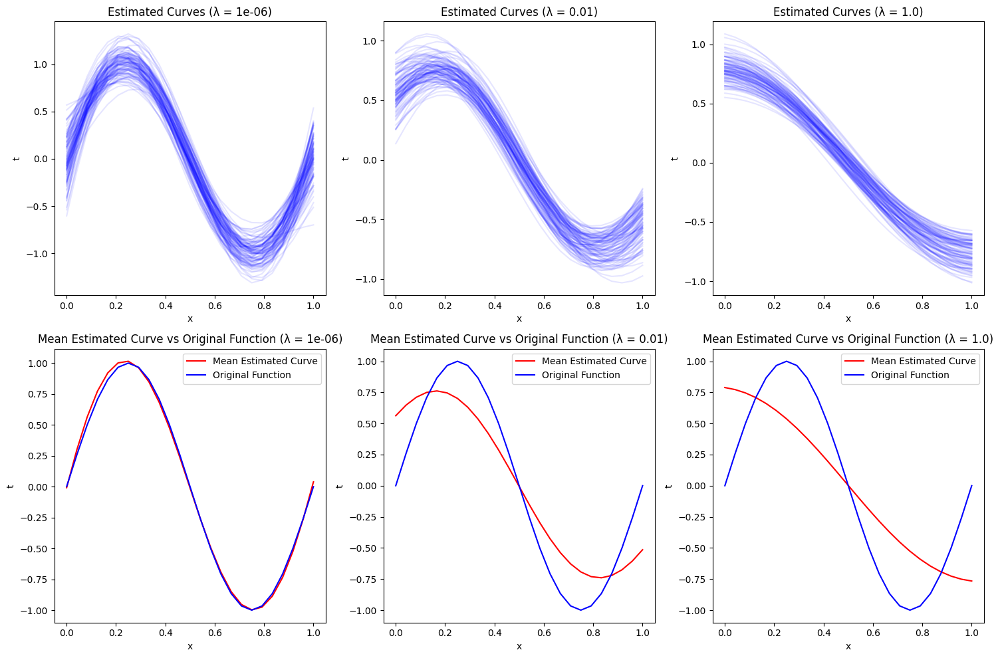

In [24]:
#Understanding the bias-variance trade-off
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################

L = 100  # Number of datasets
N = 25   # Number of data points per dataset

# Regularization coefficients: low, middle, high
lambda_values = [1e-6, 0.01, 1.0]

# Generate 100 datasets of noisy sinusoidal data
datasets = []
for _ in range(L):
    x_values = np.linspace(0, 1, N)
    t_values = np.sin(2 * np.pi * x_values) + np.random.normal(0, np.sqrt(0.1), N)
    datasets.append((x_values, t_values))

########################################
#Use regularized least squares to estimate w
########################################

w_estimates = []

for x_values, t_values in datasets:
    w_estimates_l = []
    for lambda_val in lambda_values:
        w_opt_gaus = KernelRegressionFit(x_values, t_values, 'gaussian', 24, lambda_val)
        w_estimates_l.append(w_opt_gaus)
    w_estimates.append(w_estimates_l)

########################################
#Illustrate the concept of Bias-Variance trade off
########################################

plt.figure(figsize=(15, 10))

for i, lambda_val in enumerate(lambda_values):
    # Plot 100 estimated curves for each regularization coefficient
    plt.subplot(2, 3, i+1)
    for w_est in w_estimates:
        u = np.linspace(0, 1, 25)
        y_values = np.dot(np.array([[np.e**(-((x_values - u)**2)/(2*sigma**2)) for u in np.linspace(0, 1, 25)]]), w_est[i]).flatten()
        plt.plot(x_values, y_values, color='blue', alpha=0.1)

    plt.title(f'Estimated Curves (λ = {lambda_val})')
    plt.xlabel('x')
    plt.ylabel('t')

    # Plot the mean of the estimated curves alongside the original function
    plt.subplot(2, 3, i+4)
    mean_curve = np.mean([np.dot(np.array([[np.e**(-((x_values - u)**2)/(2*sigma**2)) for u in np.linspace(0, 1, 25)]]), w) for w in np.array(w_estimates)[:,i,:]], axis=0).flatten()
    original_function = np.sin(2 * np.pi * x_values)
    plt.plot(x_values, mean_curve, color='red', label='Mean Estimated Curve')
    plt.plot(x_values, original_function, color='blue', label='Original Function')
    plt.title(f'Mean Estimated Curve vs Original Function (λ = {lambda_val})')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()

plt.tight_layout()
plt.show()


<b> Observations </b>

1. For lesser value of lamda, the curves tend to approximately match the actual sin curve.

2. As the value of lamda increases the curves tend to acquire a linear shape and become more generalized.

3. For lamda = 1e-6, the curve nearly matches with original function and deviates as we increase the lamda value.




## Conclusion

In conclusion, we found that [summary of findings]. Future work could involve [possible improvements or future work].

---



## References

- [Reference 1]
- [Reference 2]

---
